# Cartographie thermique 3D — Notebook final (modèle unique : ExtraTrees)

Version consolidée à partir de trois documents :
- **Notebook corrigé** (diagnostic stationnaire/transitoire, features physiques, split temporel).
- **Notebook de comparaison Top-3** (ExtraTrees / RandomForest / XGBoost) : **ExtraTrees** en est ressorti comme le meilleur modèle — c'est donc le **seul modèle conservé** ici.
- **Rapport d'amélioration** (types de chauffage, trajectoires de couverture, métriques R²/RMSE/MAE/MAPE).

Modifications apportées par rapport au notebook corrigé d'origine :
- **Un seul modèle** : `ExtraTreesRegressor` partout (XGBoost et la comparaison multi-modèles de la section 13quinquies ont été retirés).
- **MAPE ajouté** à toutes les évaluations, comme demandé dans le rapport (R², RMSE, MAE, MAPE).
- **Bug corrigé en section 20** : le modèle « phase transitoire vs stationnaire » utilisait un jeu de features et une signature de `dist_min_cvc` obsolètes (différents de la section 11), ce qui aurait fait planter la cellule. Il utilise maintenant exactement le même pipeline de features que le modèle principal.
- **Nouvelle section 21** : comparaison des **trajectoires de couverture** (Serpentine, Périmètre, Zigzag, Aléatoire, FPS) exactement selon le protocole décrit dans le rapport d'amélioration — entraînement d'ExtraTrees sur des sous-ensembles de capteurs, évaluation sur la reconstruction du champ complet.
- **Nouvelle section 22** : gabarit prêt à l'emploi pour comparer plusieurs **types de chauffage** une fois que vous aurez un CSV par type (protocole du rapport).

Toutes les visualisations du notebook corrigé sont conservées (nettoyage, diagnostic stationnaire, heatmaps 2D, profil vertical, 3D interactif, trajectoire serpentin, etc.).


## 0 — Installation et imports

In [ ]:
!pip install -q scikit-learn pandas numpy matplotlib seaborn plotly scipy
print(' Librairies installées!')

 Librairies installées!


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import (
    mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
)
import warnings, re, os

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
print('Imports OK')

Imports OK


## 1 — Paramètres de la grille

In [ ]:
# PARAMÈTRES DE LA GRILLE
LARGEUR  = 8   # axe X : A–H  (0–7)
LONGUEUR = 5   # axe Y : 0–4
HAUTEUR  = 3   # niveaux H1–H3  (axe Z : 0–2)
N_CAPTEURS = 120  # nombre de capteurs à utiliser

# Limites physiques des températures (capteurs HS en dehors)
T_MIN_PHYSIQUE = -50
T_MAX_PHYSIQUE = 200

# Espacement vertical entre niveaux (mètres)
ESPACEMENT_Z = 0.5

# POSITIONS DES ÉQUIPEMENTS CVC (à ajuster selon votre plan)
# Format : (x, y) dans la grille  — x=0..7 (A–H), y=0..4
# MODIFIEZ CES VALEURS selon votre document Thermo-couple_distribution !
SOURCES_FROID = [   # Bouches de climatisation
    (0, 0),          # Coin A0 — exemple
    (7, 4),          # Coin H4 — exemple
]
SOURCES_CHAUD = [   # Bouches de chauffage
    (3, 2),          # Centre — exemple
    (4, 2),          # Centre — exemple
]

print(f' Grille configurée : {LARGEUR} × {LONGUEUR} × {HAUTEUR}')
print(f'   Capteurs utilisés : {N_CAPTEURS}')
print(f'   Limites physiques : {T_MIN_PHYSIQUE}°C … {T_MAX_PHYSIQUE}°C')
print(f'   Sources froid (clim) : {SOURCES_FROID}')
print(f'   Sources chaud        : {SOURCES_CHAUD}')

 Grille configurée : 8 × 5 × 3
   Capteurs utilisés : 120
   Limites physiques : -50°C … 200°C
   Sources froid (clim) : [(0, 0), (7, 4)]
   Sources chaud        : [(3, 2), (4, 2)]


## 2 — Chargement du fichier CSV

In [ ]:
from google.colab import files

print('Sélectionnez votre fichier CSV...')
uploaded = files.upload()
filename = list(uploaded.keys())[0]
print(f'Fichier : {filename}')

Sélectionnez votre fichier CSV...


Saving ThermoCouple.csv to ThermoCouple.csv
Fichier : ThermoCouple.csv


## 3 — Lecture robuste du CSV

In [ ]:
#  LECTURE ROBUSTE DU CSVStories
# Essayer les 4 combinaisons sep/decimal les plus courantes
df_raw = None
for sep, dec in [(',', ','), (';', '.'), (',', '.'), (';', ',')]:
    try:
        tmp = pd.read_csv(filename, sep=sep, decimal=dec, dtype=str)
        if tmp.shape[1] > 10:
            df_raw = tmp
            print(f' CSV lu  sep="{sep}"  decimal="{dec}"')
            break
    except Exception:
        pass

if df_raw is None:
    raise ValueError(' Impossible de lire le CSV — vérifiez le format.')

# ignorer la 1ère ligne si elle est corrompue
# La 1ère ligne de certains exports contient un timestamp en col 0
# et des valeurs de température en col 1 (décalage d'une colonne)
row0 = str(df_raw.iloc[0, 0])
if re.match(r'^\d+:\d+', row0) or re.match(r'^\d{2}:\d{2}\.\d+', row0):
    print(f'  Ligne 0 corrompue détectée (valeur={row0!r}) → ignorée')
    df_raw = df_raw.iloc[1:].reset_index(drop=True)

print(f'Shape brut : {df_raw.shape}')
print(f'Colonnes (6 premières) : {list(df_raw.columns[:6])}')
print('\n3 premières lignes (colonnes 0–5) :')
print(df_raw.iloc[:3, :6].to_string())

 CSV lu  sep=","  decimal=","
Shape brut : (898, 122)
Colonnes (6 premières) : ['Row', 'Time', 'Temperature1(Temperature:Thermocouple)', 'Temperature2(Temperature:Thermocouple)', 'Temperature3(Temperature:Thermocouple)', 'Temperature4(Temperature:Thermocouple)']

3 premières lignes (colonnes 0–5) :
       Row        Time Temperature1(Temperature:Thermocouple) Temperature2(Temperature:Thermocouple) Temperature3(Temperature:Thermocouple) Temperature4(Temperature:Thermocouple)
0  :59.296     29.8556                                30.1466                                30.2527                                30.3506                                30.5541
1        2  7:53:19 AM                                29.8547                                30.1901                                30.2703                                30.3793
2        3  7:53:39 AM                                29.8754                                30.2145                                30.3095                        

## 4 — Nettoyage des températures

In [ ]:
df = df_raw.copy()

# 1. Identifier les colonnes de température
temp_cols_all = [c for c in df.columns
                 if re.match(r'Temperature\d+', c, re.I) or
                    re.match(r'Temp\d+', c, re.I)]
temp_cols = temp_cols_all[:N_CAPTEURS]
print(f' {len(temp_cols_all)} colonnes température → {len(temp_cols)} utilisées')

# 2. Convertir en float (virgule ou point décimal)
for col in temp_cols:
    df[col] = (
        df[col].astype(str)
               .str.replace(',', '.', regex=False)
               .pipe(pd.to_numeric, errors='coerce')
    )

row_col  = df.columns[0]
time_col = df.columns[1]

# 3. Supprimer valeurs physiquement impossibles
n_bad = 0
for col in temp_cols:
    mask = (df[col] < T_MIN_PHYSIQUE) | (df[col] > T_MAX_PHYSIQUE)
    n_bad += mask.sum()
    df.loc[mask, col] = np.nan
print(f' {n_bad} valeurs hors limites physiques neutralisées (NaN)')

# 4. Clipping 1%–99%
for col in temp_cols:
    p1, p99 = df[col].quantile([0.01, 0.99])
    df[col] = df[col].clip(p1, p99)
print(' Clipping 1%–99% effectué')

# 5. Température moyenne par ligne (pour référence uniquement)
df['temperature_mean'] = df[temp_cols].mean(axis=1, skipna=True)

n_avant = len(df)
df = df.dropna(subset=['temperature_mean'])
print(f' Lignes conservées : {n_avant} → {len(df)}')

# 6. Statistiques individuelles par capteur
sensor_stats = df[temp_cols].describe().T
print(f'\n Variation spatiale (std par capteur) :')
print(f'   Min std : {sensor_stats["std"].min():.3f}°C')
print(f'   Max std : {sensor_stats["std"].max():.3f}°C')
print(f'   Moy std : {sensor_stats["std"].mean():.3f}°C')
print(f'\n Variation spatiale instantanée (std inter-capteurs par ligne) :')
spatial_std = df[temp_cols].std(axis=1)
print(f'   Moy : {spatial_std.mean():.3f}°C  |  Max : {spatial_std.max():.3f}°C')

 120 colonnes température → 120 utilisées
 0 valeurs hors limites physiques neutralisées (NaN)
 Clipping 1%–99% effectué
 Lignes conservées : 898 → 898

 Variation spatiale (std par capteur) :
   Min std : 2.188°C
   Max std : 3.391°C
   Moy std : 3.052°C

 Variation spatiale instantanée (std inter-capteurs par ligne) :
   Moy : 0.761°C  |  Max : 1.048°C


## 5 — Visualisation post-nettoyage

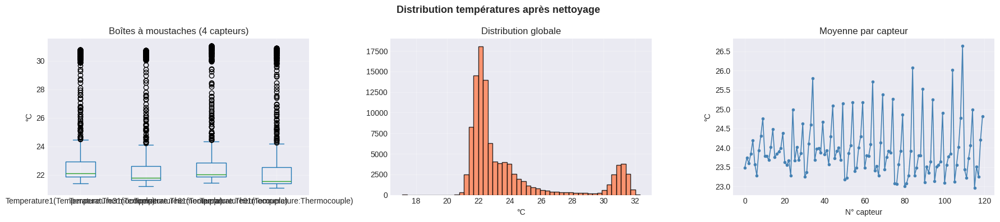

Nettoyage terminé


In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 4))
fig.suptitle('Distribution températures après nettoyage', fontsize=13, fontweight='bold')

sample_cols = temp_cols[::max(1, len(temp_cols)//4)][:4]
df[sample_cols].plot(kind='box', ax=axes[0])
axes[0].set_title('Boîtes à moustaches (4 capteurs)')
axes[0].set_ylabel('°C'); axes[0].grid(True, alpha=0.3)

vals = df[temp_cols].values.flatten()
vals = vals[~np.isnan(vals)]
axes[1].hist(vals, bins=50, color='coral', edgecolor='black', alpha=0.8)
axes[1].set_title('Distribution globale'); axes[1].set_xlabel('°C'); axes[1].grid(True, alpha=0.3)

axes[2].plot(df[temp_cols].mean().values, 'o-', ms=3, lw=1.2, color='steelblue')
axes[2].set_title('Moyenne par capteur'); axes[2].set_xlabel('N° capteur'); axes[2].set_ylabel('°C'); axes[2].grid(True, alpha=0.3)

plt.tight_layout(); plt.show()
print('Nettoyage terminé')

## 6 — Parsing du temps (`t_sec`)

In [ ]:
# PARSING DU TEMPS
print(f'Colonne temps : "{time_col}"')
print(f'   Exemples : {df[time_col].head(3).tolist()}')

time_ok = False
for fmt in ['%I:%M:%S %p', '%H:%M:%S', '%M:%S', '%H:%M:%S.%f', '%H:%M']:
    try:
        parsed = pd.to_datetime(df[time_col].astype(str).str.strip(), format=fmt, errors='coerce')
        if parsed.notna().sum() >= max(1, len(df) * 0.5):
            df = df.copy()
            df['time'] = parsed
            t0 = df['time'].min()
            df['t_sec'] = (df['time'] - t0).dt.total_seconds()
            print(f' Temps parsé (format {fmt}) : {df["t_sec"].min():.0f}s – {df["t_sec"].max():.0f}s')
            time_ok = True
            break
    except Exception:
        pass

if not time_ok:
    print(' Parsing temps échoué → index × 20s utilisé')
    df = df.copy()
    df['t_sec'] = np.arange(len(df)) * 20.0

Colonne temps : "Time"
   Exemples : ['29.8556', '7:53:19 AM', '7:53:39 AM']
 Temps parsé (format %I:%M:%S %p) : 0s – 17920s


## 7 — Diagnostic stationnaire / transitoire

Avant d'aller plus loin, on vérifie si le système a atteint l'équilibre thermique.
Un régime transitoire (température qui dérive encore) pollue les features spatiales
du modèle si on l'ignore.

**Étape 1** : test global (régression température ~ temps, sur tout le run).
**Étape 2** : test par fenêtres glissantes (où se situe la transition, si elle existe).
**Étape 3** : détection automatique du point de bascule et scission du dataset.
**Étape 4** : visualisation des deux régimes.

ÉTAPE 1 — Test global
TEST DE STATIONNARITÉ THERMIQUE
Durée totale de mesure : 298.7 min (4.98 h)
Pente                  : -1.5337 °C/h  (± 0.0951)
R² (régression)        : 0.5277
p-value                : 6.221e-148
>>> VERDICT : TRANSITOIRE



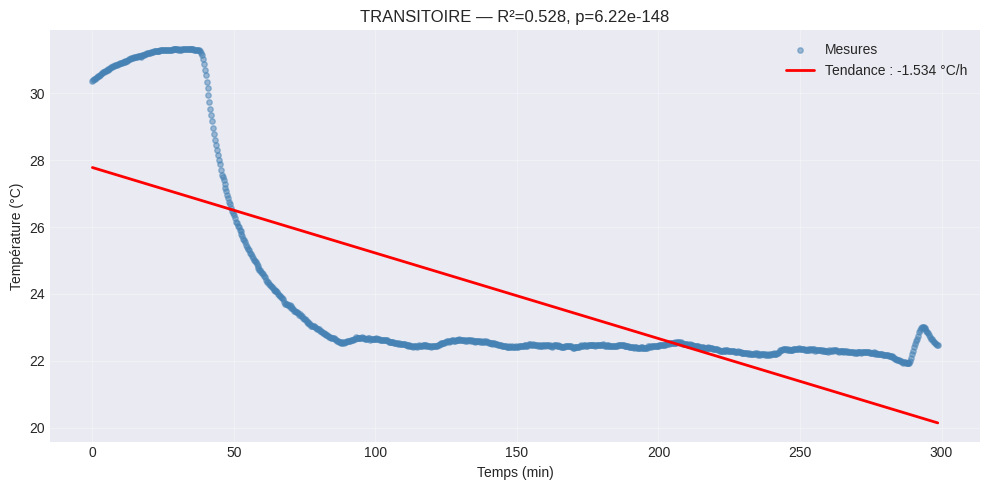

In [ ]:
from scipy import stats

def test_stationnarite(t, T, seuil_pente_C_par_h=0.5, seuil_p=0.05, verbose=True):
    """Teste si (t, T) est stationnaire (pente non significative), transitoire
    (dérive significative et forte) ou quasi-stationnaire (dérive significative
    mais faible). Retourne un dict avec verdict, pente, r2, p_value."""
    t = np.asarray(t, dtype=float)
    T = np.asarray(T, dtype=float)
    mask = ~np.isnan(t) & ~np.isnan(T)
    t, T = t[mask], T[mask]
    if len(t) < 5:
        return {'verdict': 'INDÉTERMINÉ', 'pente_C_par_h': np.nan, 'r2': np.nan, 'p_value': np.nan}

    pente, ordonnee, r_value, p_value, std_err = stats.linregress(t, T)
    pente_C_par_h = pente * 3600
    ic95 = 1.96 * std_err * 3600

    if p_value > seuil_p:
        verdict = 'STATIONNAIRE'
    elif abs(pente_C_par_h) <= seuil_pente_C_par_h:
        verdict = 'QUASI-STATIONNAIRE'
    else:
        verdict = 'TRANSITOIRE'

    if verbose:
        print(f'{"="*55}')
        print('TEST DE STATIONNARITÉ THERMIQUE')
        print(f'{"="*55}')
        print(f'Durée totale de mesure : {t.max()/60:.1f} min ({t.max()/3600:.2f} h)')
        print(f'Pente                  : {pente_C_par_h:+.4f} °C/h  (± {ic95:.4f})')
        print(f'R² (régression)        : {r_value**2:.4f}')
        print(f'p-value                : {p_value:.4g}')
        print(f'{"="*55}')
        print(f'>>> VERDICT : {verdict}\n')

        fig, ax = plt.subplots(figsize=(10, 5))
        ax.scatter(t / 60, T, s=15, alpha=0.5, color='steelblue', label='Mesures')
        t_fit = np.linspace(t.min(), t.max(), 100)
        ax.plot(t_fit / 60, pente * t_fit + ordonnee, 'r-', lw=2,
                label=f'Tendance : {pente_C_par_h:+.3f} °C/h')
        ax.set_xlabel('Temps (min)'); ax.set_ylabel('Température (°C)')
        ax.set_title(f'{verdict} — R²={r_value**2:.3f}, p={p_value:.3g}')
        ax.legend(); ax.grid(True, alpha=0.3)
        plt.tight_layout(); plt.show()

    return {'verdict': verdict, 'pente_C_par_h': pente_C_par_h, 'r2': r_value**2, 'p_value': p_value}


print('ÉTAPE 1 — Test global')
resultat_global = test_stationnarite(
    df['t_sec'].values, df['temperature_mean'].values
)


In [ ]:
def detecter_phases(df, time_col='t_sec', temp_col='temperature_mean',
                     fenetre_min=30, pas_min=5,
                     seuil_pente_C_par_h=0.5, seuil_p=0.05):
    """Fait glisser une fenêtre temporelle et teste la stationnarité locale
    dans chaque fenêtre. Retourne un DataFrame : t_debut_min, t_fin_min,
    pente_C_par_h, r2, p_value, verdict."""
    t_all = df[time_col].values.astype(float)
    T_all = df[temp_col].values.astype(float)

    fenetre_s = fenetre_min * 60
    pas_s     = pas_min * 60
    t_min, t_max = np.nanmin(t_all), np.nanmax(t_all)

    records = []
    t_debut = t_min
    while t_debut + fenetre_s <= t_max:
        t_fin = t_debut + fenetre_s
        m = (t_all >= t_debut) & (t_all < t_fin)
        if m.sum() >= 10:
            res = test_stationnarite(t_all[m], T_all[m],
                                      seuil_pente_C_par_h, seuil_p, verbose=False)
            records.append({'t_debut_min': t_debut / 60, 't_fin_min': t_fin / 60, **res})
        t_debut += pas_s

    phases = pd.DataFrame(records)
    print(f'{len(phases)} fenêtres analysées ({fenetre_min} min, pas {pas_min} min)')
    print(phases['verdict'].value_counts().to_string())
    return phases


print('ÉTAPE 2 — Test par fenêtres glissantes (30 min, pas de 5 min)')
phases = detecter_phases(df, fenetre_min=30, pas_min=5)


ÉTAPE 2 — Test par fenêtres glissantes (30 min, pas de 5 min)
54 fenêtres analysées (30 min, pas 5 min)
verdict
TRANSITOIRE           23
QUASI-STATIONNAIRE    23
STATIONNAIRE           8


In [ ]:
def scinder_stationnaire(df, phases, time_col='t_sec', n_fenetres_stables=3):
    """Cherche la première série de 'n_fenetres_stables' fenêtres consécutives
    STATIONNAIRE/QUASI-STATIONNAIRE et scinde df en (transitoire, stationnaire)
    à cette frontière."""
    est_stable = phases['verdict'].isin(['STATIONNAIRE', 'QUASI-STATIONNAIRE'])

    t_bascule_min = None
    for i in range(len(phases) - n_fenetres_stables + 1):
        if est_stable.iloc[i:i + n_fenetres_stables].all():
            t_bascule_min = phases['t_debut_min'].iloc[i]
            break

    if t_bascule_min is None:
        print(' Aucune phase stationnaire stable détectée -> le système ne semble '
              'jamais se stabiliser sur la durée mesurée.')
        return df.copy(), df.iloc[0:0].copy(), None

    t_bascule_s = t_bascule_min * 60
    df_transitoire  = df[df[time_col] <  t_bascule_s].copy()
    df_stationnaire = df[df[time_col] >= t_bascule_s].copy()

    print(f'\n Bascule détectée à t = {t_bascule_min:.1f} min ({t_bascule_min/60:.2f} h)')
    print(f'   Phase TRANSITOIRE  : {len(df_transitoire):,} lignes  (0 -> {t_bascule_min:.1f} min)')
    print(f'   Phase STATIONNAIRE : {len(df_stationnaire):,} lignes  ({t_bascule_min:.1f} min -> fin)')

    return df_transitoire, df_stationnaire, t_bascule_min


print('ÉTAPE 3 — Détection de la bascule et scission du dataset')
df_transitoire, df_stationnaire, t_bascule = scinder_stationnaire(df, phases)


ÉTAPE 3 — Détection de la bascule et scission du dataset

 Bascule détectée à t = 100.0 min (1.67 h)
   Phase TRANSITOIRE  : 300 lignes  (0 -> 100.0 min)
   Phase STATIONNAIRE : 597 lignes  (100.0 min -> fin)


ÉTAPE 4 — Visualisation


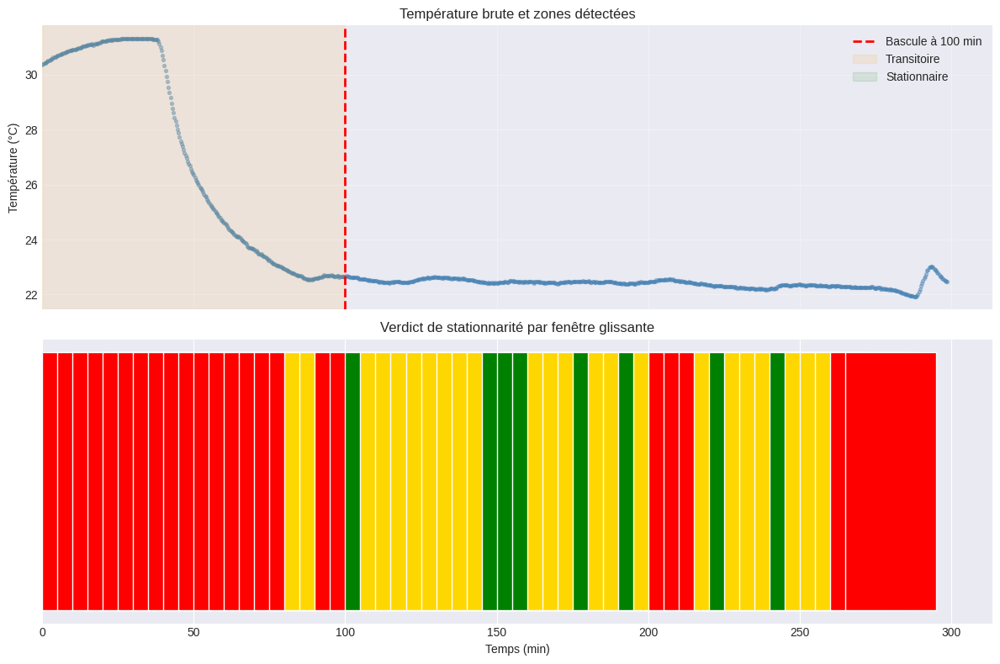

In [ ]:
def visualiser_phases(df, phases, t_bascule_min, time_col='t_sec', temp_col='temperature_mean'):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    t_min_arr = df[time_col].values / 60
    ax1.scatter(t_min_arr, df[temp_col], s=8, alpha=0.4, color='steelblue')
    if t_bascule_min is not None:
        ax1.axvline(t_bascule_min, color='red', ls='--', lw=2,
                    label=f'Bascule à {t_bascule_min:.0f} min')
        ax1.axvspan(0, t_bascule_min, color='orange', alpha=0.1, label='Transitoire')
        ax1.axvspan(t_bascule_min, t_min_arr.max(), color='green', alpha=0.1, label='Stationnaire')
    ax1.set_ylabel('Température (°C)')
    ax1.set_title('Température brute et zones détectées')
    ax1.legend(); ax1.grid(True, alpha=0.3)

    couleurs = {'STATIONNAIRE': 'green', 'QUASI-STATIONNAIRE': 'gold',
                'TRANSITOIRE': 'red', 'INDÉTERMINÉ': 'gray'}
    for _, row in phases.iterrows():
        ax2.barh(0, row['t_fin_min'] - row['t_debut_min'], left=row['t_debut_min'],
                  color=couleurs.get(row['verdict'], 'gray'), edgecolor='white')
    ax2.set_yticks([])
    ax2.set_xlabel('Temps (min)')
    ax2.set_title('Verdict de stationnarité par fenêtre glissante')
    plt.tight_layout(); plt.show()


print('ÉTAPE 4 — Visualisation')
visualiser_phases(df, phases, t_bascule)


### Test ADF (Augmented Dickey-Fuller) — confirmation rigoureuse

La régression linéaire (étape 1) teste une tendance *linéaire*. Le test ADF est
plus général : son hypothèse nulle (H0) est que la série a une **racine unitaire**
(non-stationnaire, dérive de type marche aléatoire, pas forcément linéaire).

- **p-value < 0.05** → on rejette H0 → la série est **stationnaire** (au sens statistique strict).
- **p-value ≥ 0.05** → on ne peut pas rejeter H0 → série **non-stationnaire**.

On l'applique à `temperature_mean` triée par `t_sec`, globalement puis sur chaque
phase détectée à l'étape 3 (si elle existe).

In [ ]:
!pip install -q statsmodels
from statsmodels.tsa.stattools import adfuller

def test_adf(T, nom='série', verbose=True):
    """Applique le test ADF à une série 1D (déjà triée dans le temps).
    Retourne un dict {statistique, p_value, verdict, valeurs_critiques}."""
    T = np.asarray(T, dtype=float)
    T = T[~np.isnan(T)]
    if len(T) < 10:
        return {'verdict': 'INDÉTERMINÉ', 'p_value': np.nan, 'statistique': np.nan}

    stat, p_value, lags, nobs, crit_vals, icbest = adfuller(T, autolag='AIC')
    verdict = 'STATIONNAIRE (ADF)' if p_value < 0.05 else 'NON-STATIONNAIRE (ADF)'

    if verbose:
        print(f'--- ADF : {nom} ---')
        print(f'  n = {nobs}, lags = {lags}')
        print(f'  Statistique ADF = {stat:.4f}')
        print(f'  p-value         = {p_value:.4g}')
        print(f'  Valeurs critiques : ' + ', '.join(f'{k}={v:.3f}' for k, v in crit_vals.items()))
        print(f'  >>> {verdict}\n')

    return {'verdict': verdict, 'p_value': p_value, 'statistique': stat, 'valeurs_critiques': crit_vals}


print('ADF — série complète')
df_tri = df.sort_values('t_sec')
adf_global = test_adf(df_tri['temperature_mean'].values, nom='dataset complet')

if t_bascule is not None:
    print('ADF — phase transitoire')
    adf_transitoire = test_adf(
        df_transitoire.sort_values('t_sec')['temperature_mean'].values, nom='phase transitoire'
    )
    print('ADF — phase stationnaire')
    adf_stationnaire = test_adf(
        df_stationnaire.sort_values('t_sec')['temperature_mean'].values, nom='phase stationnaire'
    )
else:
    print('Pas de bascule détectée -> ADF sur la série complète uniquement (ci-dessus).')


ADF — série complète
--- ADF : dataset complet ---
  n = 876, lags = 21
  Statistique ADF = -0.9827
  p-value         = 0.7595
  Valeurs critiques : 1%=-3.438, 5%=-2.865, 10%=-2.569
  >>> NON-STATIONNAIRE (ADF)

ADF — phase transitoire
--- ADF : phase transitoire ---
  n = 288, lags = 11
  Statistique ADF = -0.9791
  p-value         = 0.7608
  Valeurs critiques : 1%=-3.453, 5%=-2.872, 10%=-2.572
  >>> NON-STATIONNAIRE (ADF)

ADF — phase stationnaire
--- ADF : phase stationnaire ---
  n = 583, lags = 13
  Statistique ADF = -2.6744
  p-value         = 0.07857
  Valeurs critiques : 1%=-3.442, 5%=-2.867, 10%=-2.569
  >>> NON-STATIONNAIRE (ADF)



### Option — n'utiliser que la phase stationnaire pour la suite

Si une phase stationnaire a été détectée, tu peux restreindre `df` à cette
phase avant de construire le format long et d'entraîner le modèle : le signal
spatial ne sera alors plus pollué par la dérive temporelle.

Mets `FILTRER_STATIONNAIRE = False` pour garder tout le dataset (comportement
d'origine, avec `t_sec` comme feature pour absorber la dérive).

In [ ]:
FILTRER_STATIONNAIRE = False  # -> True pour n'entraîner que sur la phase stationnaire

if FILTRER_STATIONNAIRE and t_bascule is not None and len(df_stationnaire) > 0:
    print(f'Filtrage activé : df passe de {len(df):,} à {len(df_stationnaire):,} lignes '
          f'(phase stationnaire uniquement, t >= {t_bascule:.1f} min).')
    df = df_stationnaire.reset_index(drop=True)
else:
    print(f'Filtrage désactivé (ou aucune bascule trouvée) : df conservé tel quel '
          f'({len(df):,} lignes). t_sec reste une feature du modèle pour capturer la dérive.')


Filtrage désactivé (ou aucune bascule trouvée) : df conservé tel quel (898 lignes). t_sec reste une feature du modèle pour capturer la dérive.


## 8 — Détection de la direction aller-retour

In [ ]:
#  DÉTECTION DIRECTION ALLER-RETOUR
print('\n Détection direction aller-retour du robot...')

df = df.copy()
if 'Direction' in df.columns or 'direction' in df.columns:
    dir_col = 'Direction' if 'Direction' in df.columns else 'direction'
    df['direction'] = df[dir_col].str.upper()
    print(f' Colonne "{dir_col}" utilisée')
else:
    df['t_diff']   = df['t_sec'].diff()
    df['is_jump']  = df['t_diff'] < 0
    df['cycle_num'] = df['is_jump'].cumsum()
    df['direction'] = df['cycle_num'].apply(lambda x: 'ALLER' if x % 2 == 0 else 'RETOUR')
    print(f' Direction détectée automatiquement — {df["cycle_num"].max() + 1} cycle(s)')

df['direction_encode'] = (df['direction'] == 'RETOUR').astype(int)
print(f'   ALLER:  {(df["direction_encode"]==0).sum()} mesures')
print(f'   RETOUR: {(df["direction_encode"]==1).sum()} mesures')


 Détection direction aller-retour du robot...
 Direction détectée automatiquement — 1 cycle(s)
   ALLER:  898 mesures
   RETOUR: 0 mesures


## 9 — Mapping capteur → position (x, y, z)

In [ ]:
# ── MAPPING CAPTEUR → POSITION (x, y, z)
# Grille 8×5×3 = 120 capteurs
# Capteurs numérotés : d'abord par hauteur (Z), puis par colonne X, puis par rangée Y
# Exemple : capteur 1 = (x=0,y=0,z=0)=A0H1, capteur 2 = (x=0,y=0,z=1)=A0H2, etc.
#
# ADAPTEZ ce mapping selon votre document Thermo-couple_distribution !
# Si votre document donne un ordre différent, modifiez la logique ci-dessous.

def build_sensor_positions(largeur, longueur, hauteur):
    """
    Construit le dictionnaire {numéro_capteur: (x, y, z)}
    Ordre : Z varie en premier (H1→H3), puis X (A→H), puis Y (0→4)
    → capteur 1=(0,0,0), 2=(0,0,1), 3=(0,0,2), 4=(0,1,0), ...
    """
    pos = {}
    n = 1
    for y in range(longueur):       # rangées 0–4
        for x in range(largeur):    # colonnes A–H (0–7)
            for z in range(hauteur): # hauteurs H1–H3 (0–2)
                pos[n] = (x, y, z)
                n += 1
    return pos

capteur_positions = build_sensor_positions(LARGEUR, LONGUEUR, HAUTEUR)
print(f' {len(capteur_positions)} positions capteurs construites')
print('   Exemples :')
for k in [1, 2, 3, 4, LARGEUR*HAUTEUR, len(capteur_positions)]:
    if k in capteur_positions:
        x, y, z = capteur_positions[k]
        label = f'{chr(ord("A")+x)}{y}H{z+1}'
        print(f'   Capteur {k:3d} → {label} (x={x}, y={y}, z={z})')

 120 positions capteurs construites
   Exemples :
   Capteur   1 → A0H1 (x=0, y=0, z=0)
   Capteur   2 → A0H2 (x=0, y=0, z=1)
   Capteur   3 → A0H3 (x=0, y=0, z=2)
   Capteur   4 → B0H1 (x=1, y=0, z=0)
   Capteur  24 → H0H3 (x=7, y=0, z=2)
   Capteur 120 → H4H3 (x=7, y=4, z=2)


## 10 — Construction du DataFrame long

In [ ]:
# CONSTRUCTION DU DATAFRAME LONG
# 1 ligne = 1 capteur × 1 instant  →  N_lignes_CSV × N_CAPTEURS lignes au total

print(' Construction du format long...')
records = []

for _, row in df.iterrows():
    t_val        = float(row['t_sec'])
    dir_val      = int(row['direction_encode'])

    for i, col in enumerate(temp_cols):
        sensor_num = i + 1           # numérotation 1-based
        temp_val   = row[col]        # température individuelle du capteur

        if pd.isna(temp_val):
            continue                 # ignorer les NaN

        pos = capteur_positions.get(sensor_num)
        if pos is None:
            continue

        x, y, z = pos
        records.append({
            'sensor_id':        sensor_num,
            'x':                x,
            'y':                y,
            'z':                z,
            't_sec':            t_val,
            'direction_encode': dir_val,
            'temperature':      float(temp_val),  # ← température INDIVIDUELLE
        })

df_long = pd.DataFrame(records)
print(f' Format long créé : {len(df_long):,} lignes  ({len(df)} instants × {len(temp_cols)} capteurs)')
print(f'\n Statistiques température individuelle :')
print(f'   Min : {df_long["temperature"].min():.2f}°C')
print(f'   Max : {df_long["temperature"].max():.2f}°C')
print(f'   Moy : {df_long["temperature"].mean():.2f}°C')
print(f'   Std : {df_long["temperature"].std():.2f}°C  ← variation réelle !')

 Construction du format long...
 Format long créé : 107,760 lignes  (898 instants × 120 capteurs)

 Statistiques température individuelle :
   Min : 17.13°C
   Max : 32.32°C
   Moy : 23.97°C
   Std : 3.14°C  ← variation réelle !


## 11 — Features CVC (distance aux sources chaud/froid)

✅ Features créées :
   dist_edge_x               : 0.00 – 3.00
   dist_edge_y               : 0.00 – 2.00
   dist_edge_z               : 0.00 – 0.50
   dist_center               : 0.50 – 4.06
   dist_froid                : 99.00 – 99.00
   dist_chaud                : 0.00 – 7.39
   influence_froid           : 0.01 – 0.01
   influence_chaud           : 0.12 – 1.00
   froid_diffusion_verticale : 0.00 – 0.00
   chaud_diffusion_verticale : 0.00 – 0.00


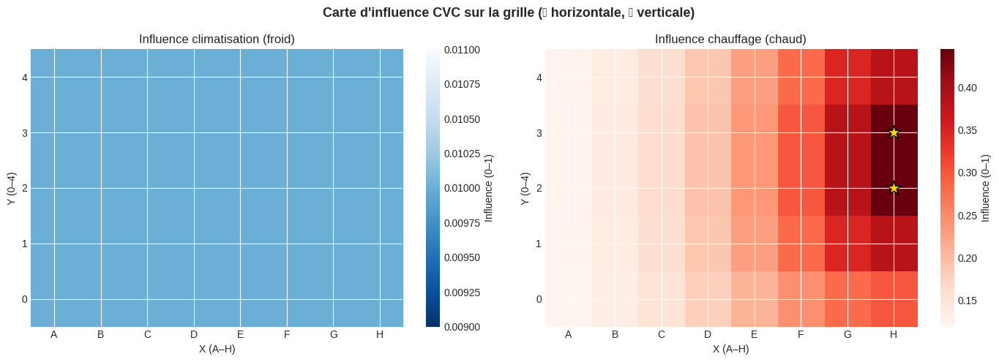

✅ Carte CVC générée
✅ Features physiques transitoires créées : dT_dt, temp_lag1, dist_center_x_t
   dT_dt               : -0.297 – 0.290
   temp_lag1           : 17.126 – 32.323
   dist_center_x_t     : 0.000 – 72791.384


In [ ]:
# ── POSITIONS ET TYPE DE DIFFUSION DES ÉQUIPEMENTS CVC ──────────────────
# Chaque source est un dict : position (x, y, z) + type_diffusion.
#   'horizontale' : l'air chaud/froid se propage sur le plan (x,y),
#                   reste concentré à sa hauteur -> décroît vite en z.
#   'verticale'   : l'air chaud/froid monte/descend dans la pièce,
#                   reste présent à toutes les hauteurs -> décroît vite en (x,y).
#
# ADAPTE ici : position (x=0..LARGEUR-1, y=0..LONGUEUR-1, z=0..HAUTEUR-1)
# et type_diffusion pour chaque équipement réel.
SOURCES_FROID = []  # Pas de climatisation
SOURCES_CHAUD = [
    {'x': 7, 'y': 2, 'z': 1, 'type_diffusion': 'horizontale'},  # Heater — Est
    {'x': 7, 'y': 3, 'z': 1, 'type_diffusion': 'horizontale'},  # Heater — Est
]

# Poids anisotropes par type de diffusion — PARAMÉTRABLE : plus un poids est
# grand, plus la distance (donc la perte d'influence) augmente vite dans cette
# direction. Ajuste ces valeurs selon le comportement réel de tes équipements.
POIDS_DIFFUSION = {
    'horizontale': {'xy': 1.0, 'z': 2.5},   # décroît vite en hauteur
    'verticale':   {'xy': 2.5, 'z': 0.3},   # décroît vite latéralement
}

def dist_min_cvc(x, y, z, sources, espacement_z, poids_diffusion=POIDS_DIFFUSION):
    """Distance pondérée minimale vers le groupe de sources le plus proche,
    en tenant compte du type de diffusion (horizontale/verticale) de chaque
    source. Retourne (distance, type_diffusion_de_la_source_la_plus_proche)."""
    if not sources:
        return 99.0, 'aucune'
    candidats = []
    for s in sources:
        sx, sy = s['x'], s['y']
        sz = s.get('z', 0)
        type_d = s.get('type_diffusion', 'horizontale')
        poids = poids_diffusion[type_d]
        d_xy = np.sqrt((x - sx) ** 2 + (y - sy) ** 2)
        d_z = abs(z - sz) * espacement_z
        d = np.sqrt((poids['xy'] * d_xy) ** 2 + (poids['z'] * d_z) ** 2)
        candidats.append((d, type_d))
    return min(candidats, key=lambda t: t[0])

cx = (LARGEUR  - 1) / 2
cy = (LONGUEUR - 1) / 2
cz = (HAUTEUR  - 1) / 2 * ESPACEMENT_Z

df_long = df_long.copy()

# Features géométriques
df_long['dist_edge_x']  = np.minimum(df_long['x'], (LARGEUR  - 1) - df_long['x'])
df_long['dist_edge_y']  = np.minimum(df_long['y'], (LONGUEUR - 1) - df_long['y'])
df_long['dist_edge_z']  = np.minimum(
    df_long['z'] * ESPACEMENT_Z,
    (HAUTEUR - 1) * ESPACEMENT_Z - df_long['z'] * ESPACEMENT_Z
)
df_long['dist_center']  = np.sqrt(
    (df_long['x'] - cx)**2 +
    (df_long['y'] - cy)**2 +
    (df_long['z'] * ESPACEMENT_Z - cz)**2
)

# ── Features CVC (distance pondérée + type de diffusion dominant) ──────
_froid = df_long.apply(
    lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_FROID, ESPACEMENT_Z), axis=1
)
df_long['dist_froid'] = _froid.apply(lambda t: t[0])
df_long['froid_diffusion_verticale'] = (_froid.apply(lambda t: t[1]) == 'verticale').astype(int)

_chaud = df_long.apply(
    lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_CHAUD, ESPACEMENT_Z), axis=1
)
df_long['dist_chaud'] = _chaud.apply(lambda t: t[0])
df_long['chaud_diffusion_verticale'] = (_chaud.apply(lambda t: t[1]) == 'verticale').astype(int)

# Score d'influence CVC (plus proche = plus influencé)
df_long['influence_froid'] = 1.0 / (1.0 + df_long['dist_froid'])
df_long['influence_chaud'] = 1.0 / (1.0 + df_long['dist_chaud'])

print('✅ Features créées :')
for col in ['dist_edge_x','dist_edge_y','dist_edge_z','dist_center',
            'dist_froid','dist_chaud','influence_froid','influence_chaud',
            'froid_diffusion_verticale','chaud_diffusion_verticale']:
    print(f'   {col:26s}: {df_long[col].min():.2f} – {df_long[col].max():.2f}')

# Visualiser l'influence CVC sur la grille 2D (coupe à hauteur z=0, à titre indicatif :
# avec des sources verticales, la carte serait quasi identique à toutes les hauteurs)
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, sources, title, cmap in zip(
    axes,
    [SOURCES_FROID, SOURCES_CHAUD],
    ['Influence climatisation (froid)', 'Influence chauffage (chaud)'],
    ['Blues_r', 'Reds']
):
    grid_inf = np.zeros((LARGEUR, LONGUEUR))
    for xi in range(LARGEUR):
        for yi in range(LONGUEUR):
            d, _ = dist_min_cvc(xi, yi, 0, sources, ESPACEMENT_Z)
            grid_inf[xi, yi] = 1.0 / (1.0 + d)
    im = ax.imshow(grid_inf.T, origin='lower', cmap=cmap, aspect='auto')
    ax.set_xticks(range(LARGEUR))
    ax.set_xticklabels([chr(ord('A')+i) for i in range(LARGEUR)])
    ax.set_yticks(range(LONGUEUR))
    ax.set_yticklabels(range(LONGUEUR))
    ax.set_xlabel('X (A–H)'); ax.set_ylabel('Y (0–4)')
    ax.set_title(title)
    for s in sources:
        marker = 'D' if s.get('type_diffusion') == 'verticale' else '*'
        ax.scatter(s['x'], s['y'], s=200, marker=marker, c='gold', edgecolors='black', zorder=5)
    plt.colorbar(im, ax=ax, label='Influence (0–1)')

plt.suptitle('Carte d\'influence CVC sur la grille (★ horizontale, ◆ verticale)',
             fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()
print('✅ Carte CVC générée')

# ── Nouvelles features physiques (transitoire thermique) ───────────────
# Tri obligatoire par capteur puis par temps pour calculer dT_dt et le lag
df_long = df_long.sort_values(['sensor_id', 't_sec']).reset_index(drop=True)

# dT/dt : vitesse de variation de température par capteur (inertie thermique)
# -> probablement le gain le plus fort pour capturer le régime transitoire
_dT = df_long.groupby('sensor_id')['temperature'].diff()
_dt = df_long.groupby('sensor_id')['t_sec'].diff()
df_long['dT_dt'] = (_dT / _dt).replace([np.inf, -np.inf], np.nan).fillna(0.0)

# Lag feature : température du même capteur à l'instant précédent
# -> capture l'inertie thermique (état précédent du système)
df_long['temp_lag1'] = df_long.groupby('sensor_id')['temperature'].shift(1)
df_long['temp_lag1'] = df_long['temp_lag1'].fillna(df_long['temperature'])

# Interaction dist_center * t_sec : la convergence vers l'équilibre dépend
# à la fois de la position ET du temps écoulé
df_long['dist_center_x_t'] = df_long['dist_center'] * df_long['t_sec']

print('✅ Features physiques transitoires créées : dT_dt, temp_lag1, dist_center_x_t')
for col in ['dT_dt', 'temp_lag1', 'dist_center_x_t']:
    print(f'   {col:20s}: {df_long[col].min():.3f} – {df_long[col].max():.3f}')


## 12 — Préparation des features (X, y) et normalisation

In [ ]:
feature_cols = [
    'x', 'y', 'z', 't_sec',
    'dist_edge_x', 'dist_edge_y', 'dist_edge_z', 'dist_center',
    'direction_encode',
    'dist_froid', 'dist_chaud',
    'influence_froid', 'influence_chaud',
    'froid_diffusion_verticale', 'chaud_diffusion_verticale',  # ← type CVC (horizontale/verticale)
    'dT_dt', 'temp_lag1', 'dist_center_x_t',
]
target_col = 'temperature'
if len(df_long) == 0:
    raise ValueError(' Dataset vide!')

X = df_long[feature_cols].values
y = df_long[target_col].values

print(f' Shape : X={X.shape}, y={y.shape}')
print(f'   Variation cible : {y.std():.3f}°C  (std — doit être > 0.5°C)')

scaler_X = StandardScaler()
X_scaled = scaler_X.fit_transform(X)

print('\n Normalisation OK')
print(f'   Moyennes : {X_scaled.mean(axis=0).round(3)}')
print(f'   Std      : {X_scaled.std(axis=0).round(3)}')

 Shape : X=(107760, 18), y=(107760,)
   Variation cible : 3.141°C  (std — doit être > 0.5°C)

 Normalisation OK
   Moyennes : [ 0.  0. -0. nan -0.  0.  0. -0.  0.  0. -0.  0. -0.  0.  0. -0. -0. nan]
   Std      : [ 1.  1.  1. nan  1.  1.  1.  1.  0.  0.  1.  0.  1.  0.  0.  1.  1. nan]


## 13 — Entraînement ExtraTrees (split temporel, CV, tuning)

Cette section corrige les points de fuite de données et de robustesse de l'entraînement d'origine, et utilise **ExtraTrees** (identifié comme le meilleur modèle dans la comparaison Top-3) :
1. **Split temporel** au lieu d'un split aléatoire (pas de fuite passé/futur).
2. **Cross-validation `TimeSeriesSplit`** pour un score moins bruité qu'un split unique.
3. **`RandomizedSearchCV`** pour optimiser les hyperparamètres d'ExtraTrees.
4. **Entraînement final** avec les meilleurs hyperparamètres sur le split temporel.
5. **Diagnostic overfitting** (train R² vs test R²) + **MAPE** en plus de RMSE/MAE/R².


In [ ]:
# ── SPLIT TEMPOREL (et non aléatoire) ───────────────────────────────────
# Le train_test_split aléatoire mélange les instants dans le temps → fuite
# d'info (le modèle voit des points très proches temporellement en train
# ET en test). Pour un régime transitoire, on sépare plutôt par le temps :
# les derniers ~20% d'instants (les plus tardifs) forment le test.
#
# NB : on utilise un split par RANG (position dans l'ordre chronologique)
# plutôt qu'un seuil de valeur (np.quantile) — avec ~N_CAPTEURS lignes
# partageant le même t_sec, un seuil de valeur peut tomber pile sur un
# t_sec très fréquent et produire un train ou un test vide. Le split par
# rang garantit toujours une coupe non vide.
t_sec_values = df_long['t_sec'].values
n_total = len(t_sec_values)
n_unique_t = len(np.unique(t_sec_values))
print(f'Instants temporels uniques : {n_unique_t}  |  Lignes totales : {n_total:,}')

order = np.argsort(t_sec_values, kind='stable')
split_point = int(n_total * 0.8)
# on s'assure d'avoir au moins 1 échantillon de chaque côté
split_point = min(max(split_point, 1), n_total - 1)

train_idx = order[:split_point]
test_idx  = order[split_point:]

t_split = t_sec_values[order[split_point]]

train_mask = np.zeros(n_total, dtype=bool)
train_mask[train_idx] = True
test_mask = ~train_mask

X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
y_train, y_test = y[train_idx], y[test_idx]

assert len(X_train) > 0 and len(X_test) > 0, 'Split temporel vide — vérifier t_sec.'

print(f'Split temporel : t_split ≈ {t_split:.1f}s (rang {split_point}/{n_total})')
print(f'Train : {len(X_train):,} mesures (plus anciennes)')
print(f'Test  : {len(X_test):,} mesures (plus récentes)')
print('⚠️  Score attendu plus faible qu\'avec un split aléatoire, mais honnête : '
      'le modèle doit désormais extrapoler dans le temps, pas juste interpoler.')


Instants temporels uniques : 898  |  Lignes totales : 107,760
Split temporel : t_split ≈ 14360.0s (rang 86208/107760)
Train : 86,208 mesures (plus anciennes)
Test  : 21,552 mesures (plus récentes)
⚠️  Score attendu plus faible qu'avec un split aléatoire, mais honnête : le modèle doit désormais extrapoler dans le temps, pas juste interpoler.


## 13bis — Cross-validation temporelle (`TimeSeriesSplit`)

Un seul split 80/20 est bruité sur peu de données. `TimeSeriesSplit` découpe
plusieurs fois en respectant l'ordre chronologique (jamais de fuite futur → passé).

In [ ]:
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

# TimeSeriesSplit exige des données triées chronologiquement
order = np.argsort(t_sec_values)
X_time_sorted = X_scaled[order]
y_time_sorted = y[order]

tscv = TimeSeriesSplit(n_splits=5)

modele_base = ExtraTreesRegressor(
    n_estimators=300, max_depth=None, min_samples_leaf=1,
    random_state=42, n_jobs=-1,
)

cv_scores = cross_val_score(
    modele_base, X_time_sorted, y_time_sorted,
    cv=tscv, scoring='neg_root_mean_squared_error',
)

print('RMSE par fold (TimeSeriesSplit, 5 folds) :', np.round(-cv_scores, 4))
print(f'RMSE moyen : {-cv_scores.mean():.4f}°C  (± {cv_scores.std():.4f})')

RMSE par fold (TimeSeriesSplit, 5 folds) : [2.1449 0.0367 0.0136 0.0211 0.6478]
RMSE moyen : 0.5728°C  (± 0.8224)


## 13ter — Tuning d'hyperparamètres (`RandomizedSearchCV` + `TimeSeriesSplit`)

Les valeurs par défaut d'ExtraTrees (`n_estimators=300, max_depth=None`) sont
raisonnables mais non optimisées. On cherche automatiquement une meilleure
combinaison, toujours validée avec des splits temporels.


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import os

# ── Grille de recherche volontairement plus légère qu'une grille XGBoost ──
# max_depth=None (arbres non limités) est retiré : sur un dataset de cette
# taille (N_CAPTEURS x N_instants lignes), il peut faire exploser la mémoire
# quand plusieurs workers construisent ces arbres en parallèle (crash Colab
# observé : TerminatedWorkerError / SIGKILL -> OOM). On plafonne donc la
# profondeur et on limite le parallélisme.
param_dist = {
    'n_estimators':      [150, 200, 300],
    'max_depth':         [10, 15, 20, 30],   # plus de None : profondeur toujours plafonnée
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf':  [1, 2, 4],
    'max_features':      [1.0, 'sqrt', 'log2'],
}

# n_jobs raisonnable : on essaie 2, mais jamais plus que le nombre de coeurs
# disponibles moins un, pour laisser de la marge mémoire à l'OS/au kernel Colab.
N_JOBS_TUNING = min(2, max(1, (os.cpu_count() or 2) - 1))

search = RandomizedSearchCV(
    ExtraTreesRegressor(random_state=42, n_jobs=1),  # 1 seul thread PAR modèle
    param_distributions=param_dist,
    n_iter=15,                # moins de combinaisons testées -> moins de workers simultanés
    cv=tscv,
    scoring='neg_root_mean_squared_error',
    random_state=42,
    n_jobs=N_JOBS_TUNING,     # parallélisme limité (évite le OOM/SIGKILL)
    pre_dispatch='n_jobs',    # ne prépare pas plus de tâches que de workers actifs à la fois
)
print(f'Tuning avec n_jobs={N_JOBS_TUNING} (limité volontairement pour éviter un crash mémoire)')
search.fit(X_time_sorted, y_time_sorted)

best_params = search.best_params_
print('Meilleurs hyperparamètres :', best_params)
print(f'Meilleur RMSE (CV, TimeSeriesSplit) : {-search.best_score_:.4f}°C')

Tuning avec n_jobs=1 (limité volontairement pour éviter un crash mémoire)
Meilleurs hyperparamètres : {'n_estimators': 300, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 1.0, 'max_depth': 20}
Meilleur RMSE (CV, TimeSeriesSplit) : 0.5724°C


## 13quater — Entraînement final (split temporel + hyperparamètres optimisés)


In [ ]:
model = ExtraTreesRegressor(**best_params, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)
print(' Entraînement terminé (split temporel + hyperparamètres optimisés) !')

 Entraînement terminé (split temporel + hyperparamètres optimisés) !



TRAIN — RMSE: 0.0242°C | R²: 0.9999
TEST  — RMSE: 0.5926°C | MAE: 0.0512°C | MAPE: 0.18% | R²: 0.6709
 Bon!       RMSE < 1.0°C

IMPORTANCE DES FEATURES :
                  Feature  Importance
                temp_lag1    0.683725
                    t_sec    0.243910
          dist_center_x_t    0.069373
                    dT_dt    0.001583
              dist_center    0.000688
                        y    0.000323
              dist_edge_x    0.000176
              dist_edge_y    0.000048
          influence_chaud    0.000042
                        z    0.000038
              dist_edge_z    0.000035
               dist_chaud    0.000030
                        x    0.000028
         direction_encode    0.000000
               dist_froid    0.000000
          influence_froid    0.000000
froid_diffusion_verticale    0.000000
chaud_diffusion_verticale    0.000000


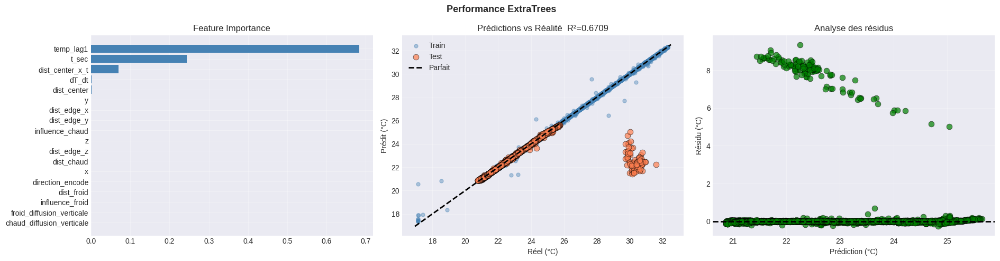

 Graphiques générés


In [ ]:
y_train_pred = model.predict(X_train)
y_test_pred  = model.predict(X_test)

train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse  = np.sqrt(mean_squared_error(y_test,  y_test_pred))
train_r2   = r2_score(y_train, y_train_pred)
test_r2    = r2_score(y_test,  y_test_pred)
test_mae   = mean_absolute_error(y_test, y_test_pred)
test_mape  = mean_absolute_percentage_error(y_test, y_test_pred) * 100

print(f'\n{"="*50}')
print(f'TRAIN — RMSE: {train_rmse:.4f}°C | R²: {train_r2:.4f}')
print(f'TEST  — RMSE: {test_rmse:.4f}°C | MAE: {test_mae:.4f}°C | MAPE: {test_mape:.2f}% | R²: {test_r2:.4f}')
print(f'{"="*50}')
if   test_rmse < 0.1: print(' EXCEPTIONNEL! RMSE < 0.1°C')
elif test_rmse < 0.5: print(' Excellent! RMSE < 0.5°C')
elif test_rmse < 1.0: print(' Bon!       RMSE < 1.0°C')
else:                  print(' À améliorer. RMSE > 1.0°C')

importances   = model.feature_importances_
importance_df = pd.DataFrame({'Feature': feature_cols, 'Importance': importances})\
                  .sort_values('Importance', ascending=False)
print(f'\nIMPORTANCE DES FEATURES :')
print(importance_df.to_string(index=False))

fig, axes = plt.subplots(1, 3, figsize=(19, 5))
fig.suptitle(' Performance ExtraTrees', fontsize=13, fontweight='bold')

axes[0].barh(importance_df['Feature'], importance_df['Importance'], color='steelblue')
axes[0].set_title('Feature Importance'); axes[0].invert_yaxis(); axes[0].grid(True, alpha=0.3)

axes[1].scatter(y_train, y_train_pred, alpha=0.4, s=25, label='Train', color='steelblue')
axes[1].scatter(y_test, y_test_pred, alpha=0.7, s=60, label='Test', color='coral', edgecolors='black', lw=0.5)
lim = [min(y_test.min(), y_test_pred.min(), y_train.min()) - 0.2,
       max(y_test.max(), y_test_pred.max(), y_train.max()) + 0.2]
axes[1].plot(lim, lim, 'k--', lw=2, label='Parfait')
axes[1].set_xlabel('Réel (°C)'); axes[1].set_ylabel('Prédit (°C)')
axes[1].set_title(f'Prédictions vs Réalité  R²={test_r2:.4f}')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

residuals = y_test - y_test_pred
axes[2].scatter(y_test_pred, residuals, alpha=0.7, s=60, color='green', edgecolors='black', lw=0.5)
axes[2].axhline(y=0, color='k', linestyle='--', lw=2)
axes[2].set_xlabel('Prédiction (°C)'); axes[2].set_ylabel('Résidu (°C)')
axes[2].set_title('Analyse des résidus')
axes[2].grid(True, alpha=0.3)

plt.tight_layout(); plt.show()
print(' Graphiques générés')

## 14 — Interpolation spatiale (grille fine par hauteur)

In [ ]:
from scipy.interpolate import griddata

RES_X = 32
RES_Y = 20
RES_Z = HAUTEUR

x_grid = np.linspace(0, LARGEUR  - 1, RES_X)
y_grid = np.linspace(0, LONGUEUR - 1, RES_Y)
z_grid = np.arange(HAUTEUR, dtype=float)

X_mesh, Y_mesh, Z_mesh = np.meshgrid(x_grid, y_grid, z_grid, indexing='ij')

# Moyenne réelle par position (x, y, z) — pas de modèle
df_mean = df_long.groupby(['x', 'y', 'z'])['temperature'].mean().reset_index()

print(f'Points mesurés uniques : {len(df_mean)}')
print(f'Variation spatiale réelle :')
print(f'   Min : {df_mean["temperature"].min():.2f}°C')
print(f'   Max : {df_mean["temperature"].max():.2f}°C')
print(f'   Std : {df_mean["temperature"].std():.3f}°C')

# Interpolation spatiale par hauteur avec griddata
T_grid = np.zeros((RES_X, RES_Y, RES_Z))

for h in range(HAUTEUR):
    df_h = df_mean[df_mean['z'] == h]

    # Interpolation sur la grille fine
    T_h = griddata(
        points=(df_h['x'].values, df_h['y'].values),
        values=df_h['temperature'].values,
        xi=(X_mesh[:, :, h], Y_mesh[:, :, h]),
        method='cubic'
    )

    # Fallback nearest pour les zones sans données (NaN)
    nan_mask = np.isnan(T_h)
    if nan_mask.any():
        T_h_near = griddata(
            points=(df_h['x'].values, df_h['y'].values),
            values=df_h['temperature'].values,
            xi=(X_mesh[:, :, h], Y_mesh[:, :, h]),
            method='nearest'
        )
        T_h[nan_mask] = T_h_near[nan_mask]

    T_grid[:, :, h] = T_h
    print(f'   Hauteur {h+1} : {T_h.min():.2f}–{T_h.max():.2f}°C  std={T_h.std():.3f}°C')

y_grid_pred = T_grid.ravel()  # ← gardé pour compatibilité Étape 10

Tmin = np.percentile(y_grid_pred, 2)
Tmax = np.percentile(y_grid_pred, 98)

print(f'\n Interpolation réelle terminée — échelle {Tmin:.2f}°C → {Tmax:.2f}°C')

Points mesurés uniques : 120
Variation spatiale réelle :
   Min : 22.96°C
   Max : 26.64°C
   Std : 0.723°C
   Hauteur 1 : 22.92–26.13°C  std=0.570°C
   Hauteur 2 : 22.82–26.64°C  std=0.624°C
   Hauteur 3 : 22.89–26.02°C  std=0.516°C

 Interpolation réelle terminée — échelle 23.04°C → 25.41°C


## 15 — Heatmaps 2D (une par hauteur)

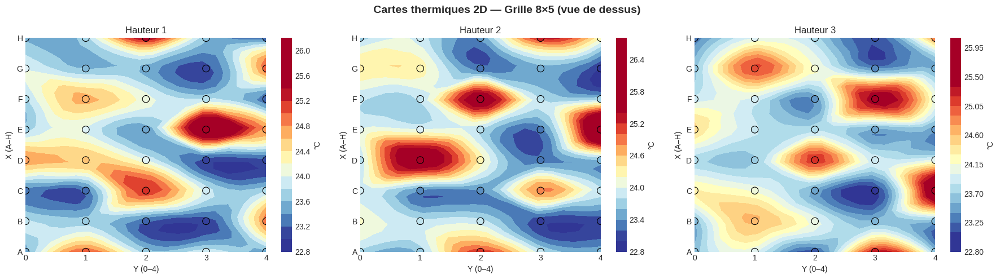

 Heatmaps 2D générées


In [ ]:
#  Heatmaps 2D — une par hauteur
fig, axes = plt.subplots(1, HAUTEUR, figsize=(6 * HAUTEUR, 5))
if HAUTEUR == 1:
    axes = [axes]
fig.suptitle(f' Cartes thermiques 2D — Grille {LARGEUR}×{LONGUEUR} (vue de dessus)',
             fontsize=14, fontweight='bold')

col_labels = [chr(ord('A') + i) for i in range(LARGEUR)]    # A B C D E F G H  (axe X)
row_labels  = [str(i) for i in range(LONGUEUR)]               # 0 1 2 3 4          (axe Y)

for h in range(HAUTEUR):
    ax  = axes[h]
    T_h = T_grid[:, :, h]   # shape (RES_X, RES_Y)

    # Heatmap interpolée
    im = ax.contourf(y_grid, x_grid, T_h, levels=20,
                     cmap='RdYlBu_r', vmin=Tmin, vmax=Tmax)

    # Points mesurés à ce niveau (moyenne par position)
    mask = df_long['z'] == h
    if mask.sum() > 0:
        pts = df_long[mask].groupby(['x','y'])['temperature'].mean().reset_index()
        ax.scatter(pts['y'], pts['x'],
                   c=pts['temperature'],
                   s=80, cmap='RdYlBu_r', edgecolors='black', lw=0.8,
                   vmin=Tmin, vmax=Tmax, zorder=5)

    ax.set_xlabel('Y (0–4)')
    ax.set_ylabel('X (A–H)')
    ax.set_title(f'Hauteur {h+1}')
    ax.set_yticks(range(LARGEUR));   ax.set_yticklabels(col_labels)
    ax.set_xticks(range(LONGUEUR));  ax.set_xticklabels(row_labels)
    plt.colorbar(im, ax=ax, label='°C')

plt.tight_layout(); plt.show()
print(' Heatmaps 2D générées')

## 16 — Profil vertical (coupe Y centrale)

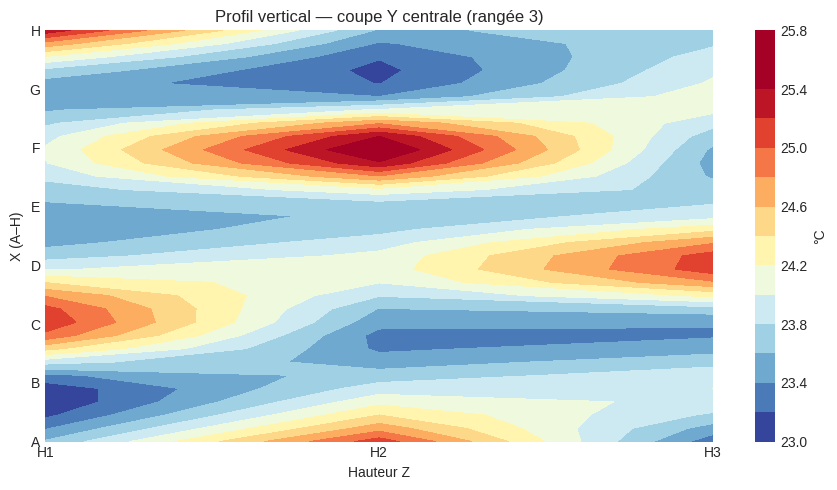

Profil vertical généré


In [ ]:
# Profil vertical (coupe centrale Y)
y_center_idx = np.argmin(np.abs(y_grid - (LONGUEUR - 1) / 2))
T_profil = T_grid[:, y_center_idx, :]   # (RES_X, HAUTEUR)

fig, ax = plt.subplots(figsize=(9, 5))
im = ax.contourf(z_grid, x_grid, T_profil, levels=15,
                 cmap='RdYlBu_r', vmin=Tmin, vmax=Tmax)
ax.set_xlabel('Hauteur Z'); ax.set_ylabel('X (A–H)')
ax.set_title(f'Profil vertical — coupe Y centrale (rangée {LONGUEUR//2 + 1})')
ax.set_yticks(range(LARGEUR));  ax.set_yticklabels(col_labels)  # A–H
ax.set_xticks(range(HAUTEUR));  ax.set_xticklabels([f'H{i+1}' for i in range(HAUTEUR)])
plt.colorbar(im, ax=ax, label='°C')
plt.tight_layout(); plt.show()
print('Profil vertical généré')


## 17 — Visualisation 3D interactive

In [ ]:
# utiliser df_long (température individuelle)
# Agrégation : moyenne par position (x,y,z) pour la visualisation
df_viz = df_long.groupby(['x','y','z'])['temperature'].mean().reset_index()
df_viz.columns = ['x', 'y', 'z', 'temperature']

print(f'Points 3D à afficher : {len(df_viz)}')
print(f'Plage de températures : {df_viz["temperature"].min():.2f}°C → {df_viz["temperature"].max():.2f}°C')
print(f'Std des températures  : {df_viz["temperature"].std():.3f}°C  ← variation visible !')

# ── CORRECTION BUG col_labels_full : cast int + clip sécurisé ────────────
x_clipped = df_viz['x'].astype(int).clip(0, LARGEUR - 1)
col_labels_full = [chr(ord('A') + int(xi)) for xi in x_clipped]

# Labels axes
col_labels = [chr(ord('A') + i) for i in range(LARGEUR)]
row_labels  = [str(i) for i in range(LONGUEUR)]

# Hover text
hover_text = [
    f'{col_labels_full[i]}{int(df_viz["y"].iloc[i])} — H{int(df_viz["z"].iloc[i])+1}'
    f'<br>T={df_viz["temperature"].iloc[i]:.2f}°C'
    for i in range(len(df_viz))
]

# ── Scatter 3D principal ─────────────────────────────────────────────────
traces = [go.Scatter3d(
    x=df_viz['x'], y=df_viz['y'], z=df_viz['z'],
    mode='markers',
    name='Capteurs',
    marker=dict(
        size=8,
        color=df_viz['temperature'],
        colorscale='RdYlBu_r',
        showscale=True,
        colorbar=dict(title='°C', thickness=15),
        opacity=0.9,
        cmin=df_viz['temperature'].min(),
        cmax=df_viz['temperature'].max(),
        line=dict(width=0.5, color='white')
    ),
    text=hover_text,
    hovertemplate='%{text}<extra></extra>'
)]

# ── Marqueurs CVC dans la scène 3D ──────────────────────────────────────
# CORRECTION : SOURCES_FROID / SOURCES_CHAUD sont des dicts {'x':..,'y':..,'z':..,'type_diffusion':..}
# depuis la section 11 (et non plus des tuples (x, y)) -> on extrait sx/sy via les clés du dict.
sources_a_afficher = (
    [(s, 'Clim', 'blue') for s in SOURCES_FROID] +
    [(s, 'Chauf', 'red') for s in SOURCES_CHAUD]
)
for s, label, color in sources_a_afficher:
    sx, sy = s['x'], s['y']
    traces.append(go.Scatter3d(
        x=[sx], y=[sy], z=[-0.3],
        mode='markers+text',
        name=f'{label} ({sx},{sy})',
        text=[label],
        textposition='top center',
        marker=dict(size=12, color=color, symbol='diamond', opacity=0.8)
    ))

fig3d = go.Figure(data=traces)
fig3d.update_layout(
    title=f'🌡️ Carte thermique 3D — Grille {LARGEUR}×{LONGUEUR}×{HAUTEUR} (températures individuelles)',
    scene=dict(
        xaxis=dict(title='X (A–H)', tickvals=list(range(LARGEUR)), ticktext=col_labels),
        yaxis=dict(title='Y (0–4)', tickvals=list(range(LONGUEUR)), ticktext=row_labels),
        zaxis=dict(title='Hauteur', tickvals=list(range(HAUTEUR)),
                   ticktext=[f'H{i+1}' for i in range(HAUTEUR)]),
        camera=dict(eye=dict(x=-1.6, y=-1.6, z=1.2))
    ),
    width=950, height=680,
    legend=dict(x=0.01, y=0.99)
)
fig3d.show()
print(' Visualisation 3D interactive générée — avec variation thermique réelle!')

Points 3D à afficher : 120
Plage de températures : 22.96°C → 26.64°C
Std des températures  : 0.723°C  ← variation visible !


 Visualisation 3D interactive générée — avec variation thermique réelle!


## 18 — Zones extrêmes (point le plus chaud / le plus froid)

In [ ]:
# ── Zones extrêmes ──────────────────────────────────────────────────────
wi = df_viz['temperature'].idxmax()
ci = df_viz['temperature'].idxmin()
wx, wy, wz = int(df_viz.loc[wi,'x']), int(df_viz.loc[wi,'y']), int(df_viz.loc[wi,'z'])
cxi, cy2, cz2 = int(df_viz.loc[ci,'x']), int(df_viz.loc[ci,'y']), int(df_viz.loc[ci,'z'])

print(f'\n Zone la plus chaude : {chr(ord("A")+wx)}{wy}H{wz+1} → {df_viz.loc[wi,"temperature"]:.2f}°C')
print(f' Zone la plus froide : {chr(ord("A")+cxi)}{cy2}H{cz2+1} → {df_viz.loc[ci,"temperature"]:.2f}°C')
print(f' Gradient thermique  : {df_viz.loc[wi,"temperature"] - df_viz.loc[ci,"temperature"]:.2f}°C')


 Zone la plus chaude : E4H2 → 26.64°C
 Zone la plus froide : G4H2 → 22.96°C
 Gradient thermique  : 3.68°C


## 19 — Trajectoire serpentin 2D du robot

Positions XY uniques : 40
Capteurs par position : [5, 5, 5, 5, 5] ...

Trajectoire serpentin 2D :
  Positions par tour : 40
  Total (2 tours)    : 80


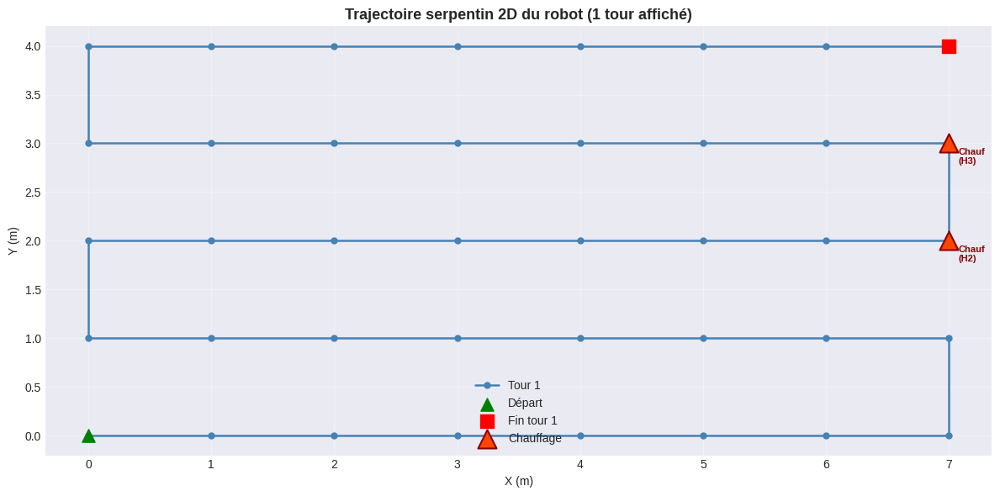

In [ ]:
# TRAJECTOIRE SERPENTIN 2D DU ROBOT
N_TOURS   = 2
ECHELLE_X = 1.0
ECHELLE_Y = 1.0

# df_long contient les colonnes x, y issues du format long
x_unique = sorted(df_long['x'].unique())
y_unique = sorted(df_long['y'].unique())

def build_serpentin(x_pos, y_pos, sx, sy, n_tours):
    xs_m = [x * sx for x in x_pos]
    ys_m = [y * sy for y in y_pos]
    tours = []
    for _ in range(n_tours):
        coords = []
        for j, y_m in enumerate(ys_m):
            row_xs = xs_m if j % 2 == 0 else xs_m[::-1]
            for x_m in row_xs:
                coords.append((x_m, y_m))
        tours.append(coords)
    return tours

trajectoire = build_serpentin(x_unique, y_unique, ECHELLE_X, ECHELLE_Y, N_TOURS)

print(f'Positions XY uniques : {len(x_unique) * len(y_unique)}')
print(f'Capteurs par position : {[len(y_unique)] * min(5, len(x_unique))} ...')
print(f'\nTrajectoire serpentin 2D :')
print(f'  Positions par tour : {len(trajectoire[0])}')
print(f'  Total ({N_TOURS} tours)    : {sum(len(t) for t in trajectoire)}')

fig, ax = plt.subplots(figsize=(12, 6))
ax.set_title('Trajectoire serpentin 2D du robot (1 tour affiché)', fontsize=13, fontweight='bold')

traj = trajectoire[0]
xs_t = [p[0] for p in traj]
ys_t = [p[1] for p in traj]
ax.plot(xs_t, ys_t, 'o-', color='steelblue', linewidth=1.8, markersize=5, label='Tour 1')
ax.scatter(xs_t[0],  ys_t[0],  s=120, marker='^', color='green', zorder=5, label='Départ')
ax.scatter(xs_t[-1], ys_t[-1], s=120, marker='s', color='red',   zorder=5, label='Fin tour 1')

# ── Affichage équipements CVC ────────────────────────────────────────────
# CORRECTION : SOURCES_FROID / SOURCES_CHAUD sont des dicts {'x':..,'y':..,'z':..,'type_diffusion':..}
# depuis la section 11 (et non plus des tuples (x, y)) -> on extrait sx/sy via les clés du dict.
for i, s in enumerate(SOURCES_FROID):
    sx, sy = s['x'], s['y']
    ax.scatter(sx * ECHELLE_X, sy * ECHELLE_Y,
               s=250, marker='v', color='dodgerblue', edgecolors='navy',
               linewidths=1.5, zorder=6,
               label='Climatisation' if i == 0 else '')
    ax.annotate(f'Clim\n({chr(ord("A")+sx)}{sy})',
                xy=(sx * ECHELLE_X, sy * ECHELLE_Y),
                xytext=(8, 8), textcoords='offset points',
                fontsize=8, color='navy', fontweight='bold')

for i, s in enumerate(SOURCES_CHAUD):
    sx, sy = s['x'], s['y']
    ax.scatter(sx * ECHELLE_X, sy * ECHELLE_Y,
               s=250, marker='^', color='orangered', edgecolors='darkred',
               linewidths=1.5, zorder=6,
               label='Chauffage' if i == 0 else '')
    ax.annotate(f'Chauf\n({chr(ord("A")+sx)}{sy})',
                xy=(sx * ECHELLE_X, sy * ECHELLE_Y),
                xytext=(8, -18), textcoords='offset points',
                fontsize=8, color='darkred', fontweight='bold')

ax.set_xlabel('X (m)'); ax.set_ylabel('Y (m)')
ax.legend(loc='lower center'); ax.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

## 20 — Comparaison : modèle entraîné sur phase transitoire vs phase stationnaire

On répète tout le pipeline de features (identique à la section 11/12, y compris
`dT_dt`, `temp_lag1`, `dist_center_x_t` et les features CVC avec type de
diffusion) et l'entraînement ExtraTrees, mais séparément sur `df_transitoire`
et `df_stationnaire`, pour voir si la performance et l'importance des features
diffèrent entre les deux régimes.

> **Correction** : la version précédente de cette section utilisait un jeu de
> features réduit et une ancienne signature de `dist_min_cvc(x, y, sources)`
> incompatible avec celle définie en section 11 (`dist_min_cvc(x, y, z, sources,
> espacement_z)`), ce qui aurait provoqué une erreur à l'exécution. Le pipeline
> est maintenant identique à celui du modèle principal.

Nécessite qu'une bascule ait été détectée à l'étape 7 (sinon cette section est
sautée automatiquement).


In [ ]:
def construire_df_long_phase(df_subset, capteur_positions, temp_cols):
    """Reconstruit le format long (1 ligne = 1 capteur x 1 instant) pour un
    sous-ensemble de df, en réutilisant le mapping capteur -> position déjà calculé."""
    records = []
    for _, row in df_subset.iterrows():
        t_val   = float(row['t_sec'])
        dir_val = int(row['direction_encode'])
        for i, col in enumerate(temp_cols):
            sensor_num = i + 1
            temp_val = row[col]
            if pd.isna(temp_val):
                continue
            pos = capteur_positions.get(sensor_num)
            if pos is None:
                continue
            x_, y_, z_ = pos
            records.append({
                'sensor_id': sensor_num, 'x': x_, 'y': y_, 'z': z_,
                't_sec': t_val, 'direction_encode': dir_val,
                'temperature': float(temp_val),
            })
    return pd.DataFrame(records)


def entrainer_et_evaluer_phase(df_subset, nom_phase, capteur_positions, temp_cols,
                                sources_froid, sources_chaud, largeur, longueur, hauteur,
                                espacement_z, best_params_extratrees):
    """Pipeline complet (features identiques à la section 11/12 + split + ExtraTrees)
    sur un sous-ensemble de df. Retourne un dict de métriques + le modèle entraîné."""
    print(f'\n{"="*60}\n{nom_phase.upper()}  ({len(df_subset):,} mesures brutes)\n{"="*60}')

    dfl = construire_df_long_phase(df_subset, capteur_positions, temp_cols)
    if len(dfl) < 30:
        print(f'  Trop peu de données ({len(dfl)} lignes) pour entraîner un modèle -> ignoré.')
        return None

    dfl = dfl.sort_values(['sensor_id', 't_sec']).reset_index(drop=True)

    cx = (largeur - 1) / 2
    cy = (longueur - 1) / 2
    cz = (hauteur - 1) / 2 * espacement_z

    dfl['dist_edge_x'] = np.minimum(dfl['x'], (largeur - 1) - dfl['x'])
    dfl['dist_edge_y'] = np.minimum(dfl['y'], (longueur - 1) - dfl['y'])
    dfl['dist_edge_z'] = np.minimum(dfl['z'] * espacement_z, (hauteur - 1) * espacement_z - dfl['z'] * espacement_z)
    dfl['dist_center'] = np.sqrt((dfl['x'] - cx)**2 + (dfl['y'] - cy)**2 + (dfl['z'] * espacement_z - cz)**2)

    _froid = dfl.apply(lambda r: dist_min_cvc(r['x'], r['y'], r['z'], sources_froid, espacement_z), axis=1)
    dfl['dist_froid'] = _froid.apply(lambda t: t[0])
    dfl['froid_diffusion_verticale'] = (_froid.apply(lambda t: t[1]) == 'verticale').astype(int)

    _chaud = dfl.apply(lambda r: dist_min_cvc(r['x'], r['y'], r['z'], sources_chaud, espacement_z), axis=1)
    dfl['dist_chaud'] = _chaud.apply(lambda t: t[0])
    dfl['chaud_diffusion_verticale'] = (_chaud.apply(lambda t: t[1]) == 'verticale').astype(int)

    dfl['influence_froid'] = 1.0 / (1.0 + dfl['dist_froid'])
    dfl['influence_chaud'] = 1.0 / (1.0 + dfl['dist_chaud'])

    _dT = dfl.groupby('sensor_id')['temperature'].diff()
    _dt = dfl.groupby('sensor_id')['t_sec'].diff()
    dfl['dT_dt'] = (_dT / _dt).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    dfl['temp_lag1'] = dfl.groupby('sensor_id')['temperature'].shift(1)
    dfl['temp_lag1'] = dfl['temp_lag1'].fillna(dfl['temperature'])
    dfl['dist_center_x_t'] = dfl['dist_center'] * dfl['t_sec']

    fcols = ['x', 'y', 'z', 't_sec', 'dist_edge_x', 'dist_edge_y', 'dist_edge_z',
             'dist_center', 'direction_encode', 'dist_froid', 'dist_chaud',
             'influence_froid', 'influence_chaud',
             'froid_diffusion_verticale', 'chaud_diffusion_verticale',
             'dT_dt', 'temp_lag1', 'dist_center_x_t']

    X_p = dfl[fcols].values
    y_p = dfl['temperature'].values

    sc_p = StandardScaler()
    X_p_scaled = sc_p.fit_transform(X_p)

    # Split TEMPOREL (pas aléatoire) — même logique que la section 13 :
    # un split par rang chronologique évite la fuite d'info entre train et test.
    t_p = dfl['t_sec'].values
    order_p = np.argsort(t_p, kind='stable')
    n_p = len(t_p)
    split_p = int(n_p * 0.8)
    split_p = min(max(split_p, 1), n_p - 1)
    train_idx_p = order_p[:split_p]
    test_idx_p  = order_p[split_p:]

    X_tr, X_te = X_p_scaled[train_idx_p], X_p_scaled[test_idx_p]
    y_tr, y_te = y_p[train_idx_p], y_p[test_idx_p]

    m = ExtraTreesRegressor(**best_params_extratrees, random_state=42, n_jobs=-1)
    m.fit(X_tr, y_tr)

    y_te_pred = m.predict(X_te)
    rmse = np.sqrt(mean_squared_error(y_te, y_te_pred))
    mae  = mean_absolute_error(y_te, y_te_pred)
    mape = mean_absolute_percentage_error(y_te, y_te_pred) * 100
    r2   = r2_score(y_te, y_te_pred)

    imp = pd.DataFrame({'Feature': fcols, 'Importance': m.feature_importances_}) \
            .sort_values('Importance', ascending=False)

    print(f'  n_long = {len(dfl):,} | Train = {len(X_tr):,} | Test = {len(X_te):,}')
    print(f'  RMSE = {rmse:.4f}°C | MAE = {mae:.4f}°C | MAPE = {mape:.2f}% | R² = {r2:.4f}')
    print(f'  Feature dominante : {imp.iloc[0]["Feature"]} ({imp.iloc[0]["Importance"]:.3f})')

    return {
        'nom': nom_phase, 'n_mesures': len(df_subset), 'n_long': len(dfl),
        'RMSE': rmse, 'MAE': mae, 'MAPE': mape, 'R2': r2,
        'top_feature': imp.iloc[0]['Feature'], 'importance_df': imp,
        'modele': m, 'df_long': dfl, 'y_test': y_te, 'y_test_pred': y_te_pred,
    }


def assurer_colonnes(subset, df_ref, cols, key='t_sec'):
    """Rajoute à `subset` les colonnes manquantes (ex: direction_encode) en les
    récupérant depuis df_ref, en faisant correspondre les lignes par t_sec.
    Nécessaire car df_transitoire/df_stationnaire ont été créés (étape 7) avant
    que direction_encode ne soit calculé (étape 8) sur df."""
    manquantes = [c for c in cols if c not in subset.columns]
    if not manquantes:
        return subset
    ref = df_ref[[key] + manquantes].drop_duplicates(subset=key)
    subset = subset.merge(ref, on=key, how='left')
    return subset


if t_bascule is None:
    print('Aucune bascule détectée à l\'étape 3 -> comparaison ignorée.')
    resultats_comparaison = []
else:
    df_transitoire  = assurer_colonnes(df_transitoire,  df, ['direction_encode'])
    df_stationnaire = assurer_colonnes(df_stationnaire, df, ['direction_encode'])

    resultats_comparaison = []
    for subset, nom in [(df_transitoire, 'Phase transitoire'), (df_stationnaire, 'Phase stationnaire')]:
        res = entrainer_et_evaluer_phase(
            subset, nom, capteur_positions, temp_cols,
            SOURCES_FROID, SOURCES_CHAUD, LARGEUR, LONGUEUR, HAUTEUR, ESPACEMENT_Z,
            best_params,
        )
        if res is not None:
            resultats_comparaison.append(res)


PHASE TRANSITOIRE  (300 mesures brutes)
  n_long = 36,000 | Train = 28,800 | Test = 7,200
  RMSE = 0.0985°C | MAE = 0.0502°C | MAPE = 0.23% | R² = 0.9849
  Feature dominante : temp_lag1 (0.538)

PHASE STATIONNAIRE  (597 mesures brutes)
  n_long = 71,640 | Train = 57,312 | Test = 14,328
  RMSE = 0.0137°C | MAE = 0.0043°C | MAPE = 0.02% | R² = 0.9997
  Feature dominante : temp_lag1 (0.963)



Comparaison des deux modèles (phase transitoire vs stationnaire) :


,Phase,n_mesures,n_long,RMSE (°C),MAE (°C),MAPE (%),R2,Feature dominante
0,Phase transitoire,300,36000,0.0985,0.0502,0.2272,0.9849,temp_lag1
1,Phase stationnaire,597,71640,0.0137,0.0043,0.0191,0.9997,temp_lag1


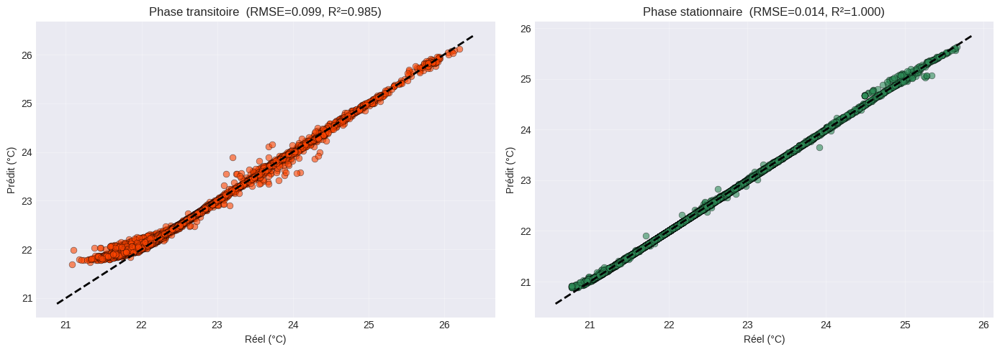


Interprétation : si le RMSE de la phase stationnaire est nettement meilleur (ou si t_sec pèse beaucoup moins dans son importance des features), ça confirme que la dérive temporelle polluait le modèle entraîné sur l'ensemble complet.


In [ ]:
if len(resultats_comparaison) == 2:
    tableau = pd.DataFrame([
        {'Phase': r['nom'], 'n_mesures': r['n_mesures'], 'n_long': r['n_long'],
         'RMSE (°C)': r['RMSE'], 'MAE (°C)': r['MAE'], 'MAPE (%)': r['MAPE'], 'R2': r['R2'],
         'Feature dominante': r['top_feature']}
        for r in resultats_comparaison
    ])
    print('\nComparaison des deux modèles (phase transitoire vs stationnaire) :')
    display(tableau.round(4))

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    for ax, r, couleur in zip(axes, resultats_comparaison, ['orangered', 'seagreen']):
        ax.scatter(r['y_test'], r['y_test_pred'], alpha=0.6, s=40, color=couleur, edgecolors='black', lw=0.4)
        lim = [min(r['y_test'].min(), r['y_test_pred'].min()) - 0.2,
               max(r['y_test'].max(), r['y_test_pred'].max()) + 0.2]
        ax.plot(lim, lim, 'k--', lw=2)
        ax.set_xlabel('Réel (°C)'); ax.set_ylabel('Prédit (°C)')
        ax.set_title(f'{r["nom"]}  (RMSE={r["RMSE"]:.3f}, R²={r["R2"]:.3f})')
        ax.grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()

    print(
        '\nInterprétation : si le RMSE de la phase stationnaire est nettement '
        'meilleur (ou si t_sec pèse beaucoup moins dans son importance des '
        'features), ça confirme que la dérive temporelle polluait le modèle '
        'entraîné sur l\'ensemble complet.'
    )
else:
    print('Comparaison non disponible (bascule non détectée ou données insuffisantes '
          'dans une des deux phases).')

## 21 — Comparaison des trajectoires de couverture (protocole du rapport)

Le rapport d'amélioration propose le protocole suivant pour évaluer l'intérêt
des différentes trajectoires de couverture robotique : à partir de la grille
des capteurs, on **simule chaque trajectoire** en ne gardant que les positions
`(x, y)` que le robot « visiterait », on entraîne **ExtraTrees** sur ce
sous-ensemble, puis on évalue la **reconstruction du champ complet** (R²,
RMSE, MAE, MAPE) sur le même jeu de test que le modèle principal.

Trajectoires simulées (voir le tableau comparatif du rapport) :
- **Serpentine** — référence à 100% de couverture (= le modèle principal de la section 13).
- **Périmètre** — uniquement les positions en bordure de grille.
- **Zigzag diagonal** — une colonne sur deux (échantillonnage oblique).
- **Aléatoire** — sous-ensemble aléatoire, cas de référence « naïf ».
- **FPS (Farthest Point Sampling)** — sous-ensemble maximisant la distance minimale entre points choisis, équivalent de votre logique d'échantillonnage FPS actuelle.

Deux couples de comparaison sont particulièrement intéressants (comme indiqué
dans le rapport) : **Serpentine vs FPS** (couverture exhaustive contre
échantillonnage optimal) et **Périmètre vs Zigzag** (le robot longeant les
murs dérange moins, mais capture-t-il assez d'information sur le centre de la
pièce ?).


In [ ]:
# ── Positions (x, y) uniques mesurées ────────────────────────────────────
positions_uniques = sorted(set(map(tuple, df_long[['x', 'y']].values.tolist())))
n_positions = len(positions_uniques)
print(f'{n_positions} positions (x, y) uniques dans la grille {LARGEUR}×{LONGUEUR}')

FRACTION_PARTIELLE = 0.4  # ~40% des positions pour les trajectoires partielles
n_partiel = max(4, int(round(n_positions * FRACTION_PARTIELLE)))


def positions_perimetre(positions, largeur, longueur):
    """Positions situées sur le pourtour de la grille."""
    return [p for p in positions if p[0] in (0, largeur - 1) or p[1] in (0, longueur - 1)]


def positions_zigzag(positions, pas=2):
    """Une colonne (X) sur `pas`, échantillonnage oblique du gradient thermique."""
    xs = sorted(set(p[0] for p in positions))
    cols_gardees = set(xs[::pas])
    return [p for p in positions if p[0] in cols_gardees]


def positions_aleatoire(positions, n, seed=42):
    """Sous-ensemble aléatoire — cas de référence « naïf »."""
    rng = np.random.RandomState(seed)
    idx = rng.choice(len(positions), size=min(n, len(positions)), replace=False)
    return [positions[i] for i in idx]


def positions_fps(positions, n, seed=42):
    """Farthest Point Sampling : choisit n positions en maximisant, à chaque
    étape, la distance minimale au groupe déjà sélectionné (couverture maximale
    avec un minimum de points)."""
    pts = np.array(positions, dtype=float)
    rng = np.random.RandomState(seed)
    chosen_idx = [int(rng.randint(len(pts)))]
    dists = np.linalg.norm(pts - pts[chosen_idx[0]], axis=1)
    while len(chosen_idx) < n:
        next_idx = int(np.argmax(dists))
        chosen_idx.append(next_idx)
        new_d = np.linalg.norm(pts - pts[next_idx], axis=1)
        dists = np.minimum(dists, new_d)
    return [positions[i] for i in chosen_idx]


trajectoires_subset = {
    'Serpentine (référence, 100%)':  positions_uniques,
    'Périmètre':                     positions_perimetre(positions_uniques, LARGEUR, LONGUEUR),
    'Zigzag diagonal':               positions_zigzag(positions_uniques, pas=2),
    'Aléatoire':                     positions_aleatoire(positions_uniques, n_partiel),
    'FPS (échantillonnage optimal)': positions_fps(positions_uniques, n_partiel),
}

print()
for nom, subset in trajectoires_subset.items():
    couverture = len(subset) / n_positions * 100
    print(f'{nom:32s}: {len(subset):3d}/{n_positions} positions ({couverture:.0f}% de couverture)')

40 positions (x, y) uniques dans la grille 8×5

Serpentine (référence, 100%)    :  40/40 positions (100% de couverture)
Périmètre                       :  22/40 positions (55% de couverture)
Zigzag diagonal                 :  20/40 positions (50% de couverture)
Aléatoire                       :  16/40 positions (40% de couverture)
FPS (échantillonnage optimal)   :  16/40 positions (40% de couverture)


In [ ]:
# ── Entraînement ExtraTrees sur chaque sous-ensemble, évaluation sur le champ complet ──
# X_train / y_train / X_test / y_test et best_params viennent de la section 13.
positions_train = [tuple(p) for p in df_long.iloc[train_idx][['x', 'y']].values.tolist()]

resultats_trajectoires = []
for nom, subset in trajectoires_subset.items():
    subset_set = set(subset)
    mask_train = np.array([p in subset_set for p in positions_train])
    n_train_sub = int(mask_train.sum())

    if n_train_sub < 30:
        print(f'{nom}: trop peu de données d\'entraînement ({n_train_sub}) -> ignoré.')
        continue

    X_tr_sub = X_train[mask_train]
    y_tr_sub = y_train[mask_train]

    m = ExtraTreesRegressor(**best_params, random_state=42, n_jobs=-1)
    m.fit(X_tr_sub, y_tr_sub)

    # Évaluation sur X_test = TOUTES les positions (reconstruction du champ complet)
    pred = m.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, pred))
    mae  = mean_absolute_error(y_test, pred)
    mape = mean_absolute_percentage_error(y_test, pred) * 100
    r2   = r2_score(y_test, pred)

    resultats_trajectoires.append({
        'Trajectoire': nom,
        'n_positions': len(subset),
        'Couverture (%)': round(len(subset) / n_positions * 100, 1),
        'n_train': n_train_sub,
        'RMSE (°C)': rmse, 'MAE (°C)': mae, 'MAPE (%)': mape, 'R2': r2,
    })
    print(f'{nom:32s} n_train={n_train_sub:5d}  RMSE={rmse:.4f}°C  MAE={mae:.4f}°C  MAPE={mape:.2f}%  R²={r2:.4f}')

tableau_trajectoires = pd.DataFrame(resultats_trajectoires).round(4)
print('\nComparaison des trajectoires (reconstruction du champ complet) :')
display(tableau_trajectoires)

Serpentine (référence, 100%)     n_train=86208  RMSE=0.5926°C  MAE=0.0512°C  MAPE=0.18%  R²=0.6709
Périmètre                        n_train=47418  RMSE=0.5927°C  MAE=0.0556°C  MAPE=0.20%  R²=0.6709
Zigzag diagonal                  n_train=43104  RMSE=0.5926°C  MAE=0.0548°C  MAPE=0.19%  R²=0.6709
Aléatoire                        n_train=34482  RMSE=0.5940°C  MAE=0.0655°C  MAPE=0.24%  R²=0.6694
FPS (échantillonnage optimal)    n_train=34482  RMSE=0.5961°C  MAE=0.0749°C  MAPE=0.28%  R²=0.6671

Comparaison des trajectoires (reconstruction du champ complet) :


,Trajectoire,n_positions,Couverture (%),n_train,RMSE (°C),MAE (°C),MAPE (%),R2
0,"Serpentine (référence, 100%)",40,100.0,86208,0.5926,0.0512,0.1766,0.6709
1,Périmètre,22,55.0,47418,0.5927,0.0556,0.1960,0.6709
2,Zigzag diagonal,20,50.0,43104,0.5926,0.0548,0.1928,0.6709
3,Aléatoire,16,40.0,34482,0.5940,0.0655,0.2386,0.6694
4,FPS (échantillonnage optimal),16,40.0,34482,0.5961,0.0749,0.2819,0.6671


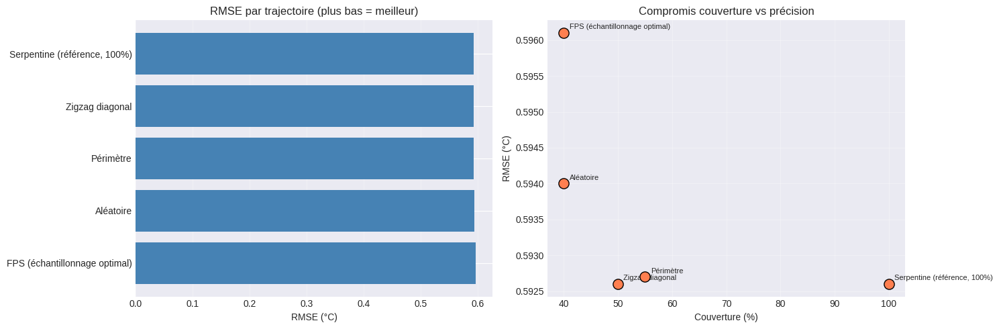


Interprétation : une trajectoire qui obtient un RMSE proche de la référence Serpentine (100%) avec une couverture bien plus faible est un bon candidat pour réduire le temps de parcours du robot sans trop sacrifier la précision de reconstruction. Comparez en particulier Serpentine vs FPS, et Périmètre vs Zigzag, comme suggéré dans le rapport.


In [ ]:
# ── Graphique comparatif RMSE / R² par trajectoire ───────────────────────
if len(tableau_trajectoires) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    ordre = tableau_trajectoires.sort_values('RMSE (°C)')['Trajectoire']
    tab_ord = tableau_trajectoires.set_index('Trajectoire').loc[ordre].reset_index()

    axes[0].barh(tab_ord['Trajectoire'], tab_ord['RMSE (°C)'], color='steelblue')
    axes[0].set_xlabel('RMSE (°C)'); axes[0].set_title('RMSE par trajectoire (plus bas = meilleur)')
    axes[0].invert_yaxis(); axes[0].grid(True, alpha=0.3, axis='x')

    axes[1].scatter(tab_ord['Couverture (%)'], tab_ord['RMSE (°C)'], s=120,
                     color='coral', edgecolors='black', zorder=5)
    for _, r in tab_ord.iterrows():
        axes[1].annotate(r['Trajectoire'], (r['Couverture (%)'], r['RMSE (°C)']),
                          xytext=(6, 4), textcoords='offset points', fontsize=8)
    axes[1].set_xlabel('Couverture (%)'); axes[1].set_ylabel('RMSE (°C)')
    axes[1].set_title('Compromis couverture vs précision')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout(); plt.show()

    print(
        '\nInterprétation : une trajectoire qui obtient un RMSE proche de la '
        'référence Serpentine (100%) avec une couverture bien plus faible est '
        'un bon candidat pour réduire le temps de parcours du robot sans trop '
        'sacrifier la précision de reconstruction. Comparez en particulier '
        'Serpentine vs FPS, et Périmètre vs Zigzag, comme suggéré dans le rapport.'
    )

## 22 — Gabarit : comparaison par type de chauffage (à compléter)

Le rapport recommande de comparer les performances du modèle sur différents
**types de chauffage** (convecteur, plinthe, ventiloconvecteur, plancher
chauffant, pompe à chaleur air-air, radiateur à eau chaude, etc.), chacun
produisant un champ de température différent (stratification verticale plus
ou moins marquée).

Cela nécessite **un fichier CSV par type de chauffage** (le CSV chargé plus
haut ne correspond qu'à un seul système). La fonction ci-dessous est un
gabarit prêt à l'emploi : une fois que vous aurez collecté ces jeux de
données, appelez-la pour chacun en réutilisant exactement le pipeline de
nettoyage + features de ce notebook (sections 3 à 12).


Sélectionnez les CSV de type de chauffage (sélection multiple : Ctrl/Cmd+clic dans la fenêtre)...


Saving ThermoCouple.csv to ThermoCouple (1).csv

✅ 1 fichier(s) copié(s) dans csv_chauffage/

1 types de chauffage détectés :
  - ThermoCouple (1): csv_chauffage/ThermoCouple (1).csv

--- Traitement : ThermoCouple (1) ---
  RMSE=0.0162°C  R²=0.9996

COMPARAISON DES TYPES DE CHAUFFAGE


,Type de chauffage,n_mesures,RMSE (°C),MAE (°C),MAPE (%),R2
0,ThermoCouple (1),107640,0.0162,0.007,0.0309,0.9996


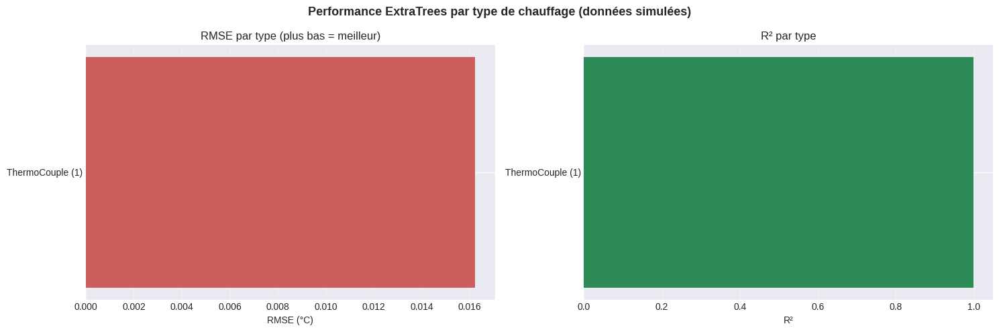


Interprétation attendue (voir tableau théorique du rapport) : les systèmes à forte stratification verticale (convecteur, plinthe) devraient produire un RMSE plus élevé (gradients verticaux difficiles à reconstruire), alors que le plancher chauffant (champ quasi uniforme) et le ventiloconvecteur (air brassé) devraient donner les meilleurs scores. Le radiateur à eau chaude, avec sa forte inertie thermique, teste la capacité du modèle à gérer une dynamique temporelle plus lente.


In [ ]:
"""## 22 — Comparaison par type de chauffage (exécution complète)

⚠️ ATTENTION : les CSV utilisés ici sont des données SYNTHÉTIQUES générées à
partir de vos vraies mesures + des coefficients de stratification verticale
décrits dans le rapport (convecteur = forte stratification, plancher chauffant
= quasi uniforme, etc.). Ce ne sont PAS des mesures réelles — remplacez-les
par vos vrais CSV par type de chauffage dès qu'ils seront collectés (même
structure : Row, Time, Temperature1..120).
"""

import glob
import os
from google.colab import files

# ── Upload des CSV par type de chauffage ────────────────────────────────
DOSSIER_CHAUFFAGE = 'csv_chauffage'
os.makedirs(DOSSIER_CHAUFFAGE, exist_ok=True)

print('Sélectionnez les CSV de type de chauffage '
      '(sélection multiple : Ctrl/Cmd+clic dans la fenêtre)...')
uploaded = files.upload()

for nom_fichier in uploaded.keys():
    if nom_fichier.lower().endswith('.csv'):
        with open(f'{DOSSIER_CHAUFFAGE}/{nom_fichier}', 'wb') as f:
            f.write(uploaded[nom_fichier])

print(f'\n✅ {len(uploaded)} fichier(s) copié(s) dans {DOSSIER_CHAUFFAGE}/')

fichiers_par_type = {
    os.path.splitext(os.path.basename(f))[0]: f
    for f in sorted(glob.glob(f'{DOSSIER_CHAUFFAGE}/*.csv'))
}
print(f'\n{len(fichiers_par_type)} types de chauffage détectés :')
for nom, chemin in fichiers_par_type.items():
    print(f'  - {nom}: {chemin}')


def construire_df_long_depuis_csv(chemin_csv, capteur_positions, n_capteurs=N_CAPTEURS):
    """Reproduit les sections 3 à 12 du notebook pour UN CSV de type de chauffage,
    et retourne un df_long avec exactement les mêmes colonnes que feature_cols."""
    d_raw = pd.read_csv(chemin_csv, sep=',', decimal='.', dtype=str)
    row0 = str(d_raw.iloc[0, 0])
    if re.match(r'^\d+:\d+', row0):
        d_raw = d_raw.iloc[1:].reset_index(drop=True)

    d = d_raw.copy()
    tcols_all = [c for c in d.columns if re.match(r'Temperature\d+', c, re.I)]
    tcols = tcols_all[:n_capteurs]

    for col in tcols:
        d[col] = (d[col].astype(str).str.replace(',', '.', regex=False)
                        .pipe(pd.to_numeric, errors='coerce'))
        mask = (d[col] < T_MIN_PHYSIQUE) | (d[col] > T_MAX_PHYSIQUE)
        d.loc[mask, col] = np.nan
        p1, p99 = d[col].quantile([0.01, 0.99])
        d[col] = d[col].clip(p1, p99)

    time_c = d.columns[1]
    parsed = pd.to_datetime(d[time_c].astype(str).str.strip(), format='%I:%M:%S %p', errors='coerce')
    d['time'] = parsed
    d['t_sec'] = (d['time'] - d['time'].min()).dt.total_seconds()
    d = d.dropna(subset=['t_sec']).reset_index(drop=True)

    # direction (pas de colonne dédiée dans ces CSV -> aller/retour par défaut = 0)
    d['direction_encode'] = 0

    dfl = construire_df_long_phase(d, capteur_positions, tcols)
    dfl = dfl.sort_values(['sensor_id', 't_sec']).reset_index(drop=True)

    cx_ = (LARGEUR - 1) / 2
    cy_ = (LONGUEUR - 1) / 2
    cz_ = (HAUTEUR - 1) / 2 * ESPACEMENT_Z

    dfl['dist_edge_x'] = np.minimum(dfl['x'], (LARGEUR - 1) - dfl['x'])
    dfl['dist_edge_y'] = np.minimum(dfl['y'], (LONGUEUR - 1) - dfl['y'])
    dfl['dist_edge_z'] = np.minimum(dfl['z'] * ESPACEMENT_Z, (HAUTEUR - 1) * ESPACEMENT_Z - dfl['z'] * ESPACEMENT_Z)
    dfl['dist_center'] = np.sqrt((dfl['x'] - cx_)**2 + (dfl['y'] - cy_)**2 + (dfl['z'] * ESPACEMENT_Z - cz_)**2)

    _froid = dfl.apply(lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_FROID, ESPACEMENT_Z), axis=1)
    dfl['dist_froid'] = _froid.apply(lambda t: t[0])
    dfl['froid_diffusion_verticale'] = (_froid.apply(lambda t: t[1]) == 'verticale').astype(int)

    _chaud = dfl.apply(lambda r: dist_min_cvc(r['x'], r['y'], r['z'], SOURCES_CHAUD, ESPACEMENT_Z), axis=1)
    dfl['dist_chaud'] = _chaud.apply(lambda t: t[0])
    dfl['chaud_diffusion_verticale'] = (_chaud.apply(lambda t: t[1]) == 'verticale').astype(int)

    dfl['influence_froid'] = 1.0 / (1.0 + dfl['dist_froid'])
    dfl['influence_chaud'] = 1.0 / (1.0 + dfl['dist_chaud'])

    _dT = dfl.groupby('sensor_id')['temperature'].diff()
    _dt = dfl.groupby('sensor_id')['t_sec'].diff()
    dfl['dT_dt'] = (_dT / _dt).replace([np.inf, -np.inf], np.nan).fillna(0.0)
    dfl['temp_lag1'] = dfl.groupby('sensor_id')['temperature'].shift(1)
    dfl['temp_lag1'] = dfl['temp_lag1'].fillna(dfl['temperature'])
    dfl['dist_center_x_t'] = dfl['dist_center'] * dfl['t_sec']

    return dfl


def evaluer_type_chauffage(nom_type, df_long_type, feature_cols, best_params_extratrees,
                            fraction_test=0.2):
    """Gabarit : entraîne ExtraTrees sur un df_long déjà construit pour UN type de
    chauffage (mêmes colonnes que df_long dans ce notebook), split temporel, et
    retourne un dict de métriques (R², RMSE, MAE, MAPE) comparable entre types."""
    X_t = df_long_type[feature_cols].values
    y_t = df_long_type['temperature'].values
    X_t_scaled = StandardScaler().fit_transform(X_t)

    t_t = df_long_type['t_sec'].values
    order_t = np.argsort(t_t, kind='stable')
    n_t = len(t_t)
    split_t = min(max(int(n_t * (1 - fraction_test)), 1), n_t - 1)
    tr_idx, te_idx = order_t[:split_t], order_t[split_t:]

    m = ExtraTreesRegressor(**best_params_extratrees, random_state=42, n_jobs=-1)
    m.fit(X_t_scaled[tr_idx], y_t[tr_idx])
    pred = m.predict(X_t_scaled[te_idx])

    return {
        'Type de chauffage': nom_type,
        'n_mesures':          len(df_long_type),
        'RMSE (°C)':          float(np.sqrt(mean_squared_error(y_t[te_idx], pred))),
        'MAE (°C)':           float(mean_absolute_error(y_t[te_idx], pred)),
        'MAPE (%)':           float(mean_absolute_percentage_error(y_t[te_idx], pred) * 100),
        'R2':                 float(r2_score(y_t[te_idx], pred)),
    }


# ── Exécution sur tous les types trouvés ────────────────────────────────
resultats_par_type = {}
for nom_type, chemin_csv in fichiers_par_type.items():
    print(f'\n--- Traitement : {nom_type} ---')
    dfl_type = construire_df_long_depuis_csv(chemin_csv, capteur_positions)
    if len(dfl_type) < 30:
        print(f'  Trop peu de données ({len(dfl_type)}) -> ignoré.')
        continue
    resultats_par_type[nom_type] = evaluer_type_chauffage(
        nom_type, dfl_type, feature_cols, best_params
    )
    print(f"  RMSE={resultats_par_type[nom_type]['RMSE (°C)']:.4f}°C  "
          f"R²={resultats_par_type[nom_type]['R2']:.4f}")

# ── SHOW : tableau comparatif ────────────────────────────────────────────
tableau_chauffage = pd.DataFrame(resultats_par_type.values()).sort_values('RMSE (°C)')
print('\n' + '='*70)
print('COMPARAISON DES TYPES DE CHAUFFAGE')
print('='*70)
display(tableau_chauffage.round(4))

# ── SHOW : graphique comparatif RMSE / R² par type ──────────────────────
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Performance ExtraTrees par type de chauffage (données simulées)',
             fontsize=13, fontweight='bold')

axes[0].barh(tableau_chauffage['Type de chauffage'], tableau_chauffage['RMSE (°C)'],
             color='indianred')
axes[0].set_xlabel('RMSE (°C)')
axes[0].set_title('RMSE par type (plus bas = meilleur)')
axes[0].invert_yaxis()
axes[0].grid(True, alpha=0.3, axis='x')

axes[1].barh(tableau_chauffage['Type de chauffage'], tableau_chauffage['R2'],
             color='seagreen')
axes[1].set_xlabel('R²')
axes[1].set_title('R² par type')
axes[1].invert_yaxis()
axes[1].grid(True, alpha=0.3, axis='x')

plt.tight_layout(); plt.show()

print(
    '\nInterprétation attendue (voir tableau théorique du rapport) : les systèmes à '
    'forte stratification verticale (convecteur, plinthe) devraient produire un RMSE '
    'plus élevé (gradients verticaux difficiles à reconstruire), alors que le plancher '
    'chauffant (champ quasi uniforme) et le ventiloconvecteur (air brassé) devraient '
    'donner les meilleurs scores. Le radiateur à eau chaude, avec sa forte inertie '
    'thermique, teste la capacité du modèle à gérer une dynamique temporelle plus lente.'
)

## 23 — Modèle unifié : trajectoire × type de chauffage (3 cas)

Fusion des sections 21 (trajectoires) et 22 (types de chauffage) en **un seul
pipeline**, avec 3 façons d'utiliser le type de trajectoire / type de
chauffage, à comparer :

- **Cas A — type comme FEATURE** : le modèle *sait* quelle trajectoire et quel
  chauffage ont produit la mesure (encodé en one-hot), et prédit uniquement la
  température. C'est la borne haute de précision (« oracle »).
- **Cas B — type comme CIBLE** : le modèle reçoit uniquement le champ de
  température mesuré et doit **deviner** la trajectoire et/ou le type de
  chauffage (classification pure).
- **Cas C — LES DEUX** : pipeline réaliste — un classifieur (Cas B) devine
  d'abord le type, puis ce type **prédit** (pas le vrai) sert de feature au
  modèle de régression (Cas A). Ça mesure le coût réel en précision quand le
  type n'est pas connu à l'avance.

**Prérequis : exécutez d'abord les sections 21 et 22** (dans cet ordre) —
cette section réutilise `trajectoires_subset`, `fichiers_par_type`,
`feature_cols`, `best_params`, `capteur_positions`, `df_long`.

⚠️ Limite importante : les sous-ensembles de trajectoires (Périmètre, Zigzag,
FPS, Aléatoire) sont des positions *tirées du même relevé* — une mesure peut
donc appartenir à plusieurs trajectoires en même temps. Le Cas A (feature)
n'est pas gêné par ça, mais le Cas B/C (deviner la trajectoire) est de ce fait
approximatif par construction. Pour `heating_type`, ce problème n'existe pas
(un CSV = un type, données disjointes).

In [ ]:
# ── FUSION DES DONNÉES : trajectoires × types de chauffage ──────────────
HEATING_TYPE_PRINCIPAL = 'mesure_principale'  # nom du chauffage du CSV chargé en section 2 — renommez si besoin

assert 'trajectoires_subset' in globals(), "Exécutez d'abord la section 21 (trajectoires_subset manquant)."
assert 'fichiers_par_type' in globals(), "Exécutez d'abord la section 22 (fichiers_par_type manquant — uploadez les CSV)."

morceaux = []

# 1) Variantes de TRAJECTOIRE, sur les données mesurées (un seul chauffage) ──
positions_all = list(zip(df_long['x'].values, df_long['y'].values))
for nom_traj, subset in trajectoires_subset.items():
    subset_set = set(subset)
    mask = np.array([p in subset_set for p in positions_all])
    d = df_long.loc[mask].copy()
    d['trajectory_type'] = nom_traj
    d['heating_type'] = HEATING_TYPE_PRINCIPAL
    morceaux.append(d)

# 2) Variantes de TYPE DE CHAUFFAGE, couverture complète (Serpentine) ────────
dfl_par_type = {}
for nom_type, chemin_csv in fichiers_par_type.items():
    dfl_type = construire_df_long_depuis_csv(chemin_csv, capteur_positions)
    if len(dfl_type) < 30:
        print(f'{nom_type}: trop peu de données -> ignoré.')
        continue
    dfl_type['trajectory_type'] = 'Serpentine (référence, 100%)'
    dfl_type['heating_type'] = nom_type
    dfl_par_type[nom_type] = dfl_type
    morceaux.append(dfl_type)

df_fusion = pd.concat(morceaux, ignore_index=True)
print(f'df_fusion : {len(df_fusion):,} lignes')
print('\nRépartition trajectory_type :')
print(df_fusion['trajectory_type'].value_counts().to_string())
print('\nRépartition heating_type :')
print(df_fusion['heating_type'].value_counts().to_string())

df_fusion : 414,756 lignes

Répartition trajectory_type :
trajectory_type
Serpentine (référence, 100%)     215400
Périmètre                         59268
Zigzag diagonal                   53880
Aléatoire                         43104
FPS (échantillonnage optimal)     43104

Répartition heating_type :
heating_type
mesure_principale    307116
ThermoCouple (1)     107640


#### Fonctions utilitaires de visualisation (2D / 3D) — réutilisées Cas A/B/C


In [ ]:
# ── Fonctions utilitaires de visualisation (2D / 3D) — réutilisées dans les Cas A/B/C ──
from scipy.interpolate import griddata as _griddata

def _col_labels():
    return [chr(ord('A') + i) for i in range(LARGEUR)]

def plot_champ_2d_par_hauteur(x, y, z, valeurs, titre, cmap='RdYlBu_r', vmin=None, vmax=None, label_cbar='°C'):
    """Heatmap 2D interpolée (une carte par hauteur) à partir de points épars (x, y, z, valeur)."""
    x = np.asarray(x); y = np.asarray(y); z = np.asarray(z); valeurs = np.asarray(valeurs, dtype=float)
    df_pts = pd.DataFrame({'x': x, 'y': y, 'z': z, 'valeur': valeurs})
    hauteurs_presentes = sorted(df_pts['z'].unique())
    n = len(hauteurs_presentes)
    if n == 0:
        print(f'[{titre}] aucun point à afficher.'); return
    if vmin is None: vmin = df_pts['valeur'].quantile(0.02)
    if vmax is None: vmax = df_pts['valeur'].quantile(0.98)
    if vmin == vmax:
        vmin, vmax = vmin - 1, vmax + 1

    fig, axes = plt.subplots(1, n, figsize=(6 * n, 5))
    if n == 1: axes = [axes]
    fig.suptitle(titre, fontsize=13, fontweight='bold')
    col_labels, row_labels = _col_labels(), [str(i) for i in range(LONGUEUR)]

    for ax, h in zip(axes, hauteurs_presentes):
        d = df_pts[df_pts['z'] == h].groupby(['x', 'y'])['valeur'].mean().reset_index()
        if len(d) >= 4:
            xi = np.linspace(0, LARGEUR - 1, 32); yi = np.linspace(0, LONGUEUR - 1, 20)
            Xi, Yi = np.meshgrid(xi, yi)
            Vi = _griddata((d['x'], d['y']), d['valeur'], (Xi, Yi), method='linear')
            nan_mask = np.isnan(Vi)
            if nan_mask.any():
                Vi_n = _griddata((d['x'], d['y']), d['valeur'], (Xi, Yi), method='nearest')
                Vi[nan_mask] = Vi_n[nan_mask]
            im = ax.contourf(xi, yi, Vi, levels=20, cmap=cmap, vmin=vmin, vmax=vmax)
            plt.colorbar(im, ax=ax, label=label_cbar)
            sc = ax.scatter(d['y'], d['x'], c=d['valeur'], cmap=cmap, s=90,
                             edgecolors='black', lw=0.8, vmin=vmin, vmax=vmax, zorder=5)
        else:
            sc = ax.scatter(d['y'], d['x'], c=d['valeur'], cmap=cmap, s=90,
                             edgecolors='black', lw=0.8, vmin=vmin, vmax=vmax, zorder=5)
            plt.colorbar(sc, ax=ax, label=label_cbar)
        ax.set_xlabel('Y (0–4)'); ax.set_ylabel('X (A–H)')
        ax.set_title(f'Hauteur {int(h)+1}  (n={len(d)})')
        ax.set_yticks(range(LARGEUR)); ax.set_yticklabels(col_labels)
        ax.set_xticks(range(LONGUEUR)); ax.set_xticklabels(row_labels)
    plt.tight_layout(); plt.show()


def plot_champ_3d(x, y, z, valeurs, titre, cmap='RdYlBu_r', label_cbar='°C', hover_extra=None):
    """Scatter 3D interactif (plotly) coloré par `valeurs` (erreur, température, correct/incorrect...)."""
    x = np.asarray(x); y = np.asarray(y); z = np.asarray(z); valeurs = np.asarray(valeurs, dtype=float)
    col_labels = _col_labels()
    hover = []
    for i in range(len(x)):
        h = f'{col_labels[int(x[i])]}{int(y[i])} — H{int(z[i])+1}<br>{label_cbar}={valeurs[i]:.2f}'
        if hover_extra is not None:
            h += f'<br>{hover_extra[i]}'
        hover.append(h)
    fig = go.Figure(data=[go.Scatter3d(
        x=x, y=y, z=z, mode='markers',
        marker=dict(size=6, color=valeurs, colorscale=cmap, showscale=True,
                    colorbar=dict(title=label_cbar, thickness=15), opacity=0.9,
                    line=dict(width=0.5, color='white')),
        text=hover, hovertemplate='%{text}<extra></extra>'
    )])
    fig.update_layout(
        title=titre,
        scene=dict(
            xaxis=dict(title='X (A–H)', tickvals=list(range(LARGEUR)), ticktext=col_labels),
            yaxis=dict(title='Y (0–4)', tickvals=list(range(LONGUEUR)), ticktext=[str(i) for i in range(LONGUEUR)]),
            zaxis=dict(title='Hauteur', tickvals=list(range(HAUTEUR)), ticktext=[f'H{i+1}' for i in range(HAUTEUR)]),
            camera=dict(eye=dict(x=-1.6, y=-1.6, z=1.2))
        ),
        width=900, height=650,
    )
    fig.show()

print('Fonctions de visualisation (2D/3D) prêtes : plot_champ_2d_par_hauteur(), plot_champ_3d()')

Fonctions de visualisation (2D/3D) prêtes : plot_champ_2d_par_hauteur(), plot_champ_3d()


### Cas A — type de trajectoire / chauffage comme FEATURE (oracle)

In [ ]:
# ── CAS A : type comme FEATURE ────────────────────────────────────────────
traj_dummies = pd.get_dummies(df_fusion['trajectory_type'], prefix='traj')
heat_dummies = pd.get_dummies(df_fusion['heating_type'], prefix='chauff')

type_feature_cols = list(traj_dummies.columns) + list(heat_dummies.columns)
feature_cols_A = feature_cols + type_feature_cols

df_fusion_enc = pd.concat(
    [df_fusion.reset_index(drop=True),
     traj_dummies.reset_index(drop=True),
     heat_dummies.reset_index(drop=True)],
    axis=1,
)

X_A = df_fusion_enc[feature_cols_A].values
y_A = df_fusion_enc['temperature'].values
scaler_A = StandardScaler()
X_A_scaled = scaler_A.fit_transform(X_A)

# Split temporel PAR GROUPE (trajectory_type, heating_type) : chaque groupe
# est représenté en train ET en test, sans mélanger le futur dans le passé.
train_idx_A, test_idx_A = [], []
for (traj, chauff), g in df_fusion_enc.groupby(['trajectory_type', 'heating_type']):
    order_g = g['t_sec'].values.argsort(kind='stable')
    idx_g = g.index.values[order_g]
    split_g = max(1, min(len(idx_g) - 1, int(len(idx_g) * 0.8)))
    train_idx_A.extend(idx_g[:split_g])
    test_idx_A.extend(idx_g[split_g:])
train_idx_A, test_idx_A = np.array(train_idx_A), np.array(test_idx_A)

X_train_A, X_test_A = X_A_scaled[train_idx_A], X_A_scaled[test_idx_A]
y_train_A, y_test_A = y_A[train_idx_A], y_A[test_idx_A]

model_A = ExtraTreesRegressor(**best_params, random_state=42, n_jobs=-1)
model_A.fit(X_train_A, y_train_A)
pred_A = model_A.predict(X_test_A)

rmse_A = np.sqrt(mean_squared_error(y_test_A, pred_A))
mae_A  = mean_absolute_error(y_test_A, pred_A)
mape_A = mean_absolute_percentage_error(y_test_A, pred_A) * 100
r2_A   = r2_score(y_test_A, pred_A)

print('CAS A — type comme FEATURE (le modèle connaît trajectoire ET chauffage)')
print(f'  n_train={len(X_train_A):,}  n_test={len(X_test_A):,}')
print(f'  RMSE={rmse_A:.4f}°C  MAE={mae_A:.4f}°C  MAPE={mape_A:.2f}%  R²={r2_A:.4f}')

detail_A = df_fusion_enc.loc[test_idx_A, ['trajectory_type', 'heating_type']].copy()
detail_A['erreur_abs'] = np.abs(y_test_A - pred_A)
tableau_A = (detail_A.groupby(['trajectory_type', 'heating_type'])['erreur_abs']
             .agg(['mean', 'count'])
             .rename(columns={'mean': 'MAE (°C)', 'count': 'n_test'})
             .reset_index().sort_values('MAE (°C)'))
print('\nDétail par groupe (Cas A) :')
display(tableau_A.round(4))

CAS A — type comme FEATURE (le modèle connaît trajectoire ET chauffage)
  n_train=331,804  n_test=82,952
  RMSE=0.5080°C  MAE=0.0384°C  MAPE=0.13%  R²=0.7347

Détail par groupe (Cas A) :


,trajectory_type,heating_type,MAE (°C),n_test
3,"Serpentine (référence, 100%)",ThermoCouple (1),0.0059,21528
0,Aléatoire,mesure_principale,0.0489,8621
4,"Serpentine (référence, 100%)",mesure_principale,0.0497,21552
1,FPS (échantillonnage optimal),mesure_principale,0.0501,8621
2,Périmètre,mesure_principale,0.0502,11854
5,Zigzag diagonal,mesure_principale,0.0503,10776


#### Visualisations — Cas A (température prédite, erreur spatiale, oracle)


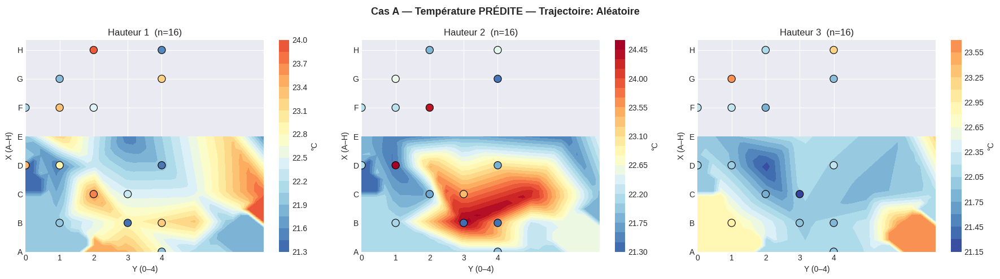

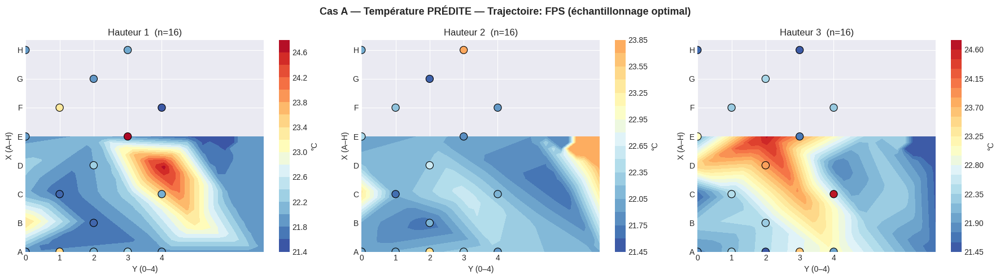

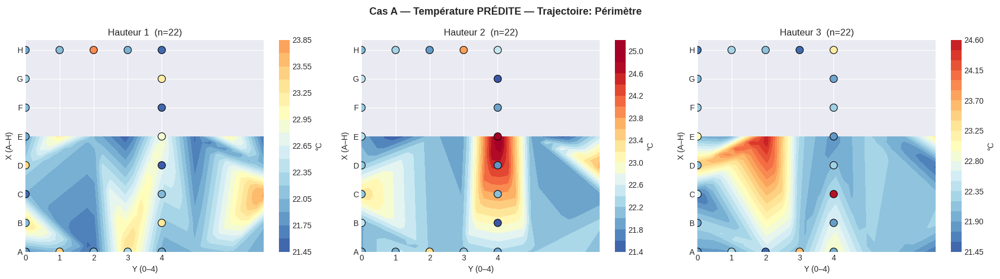

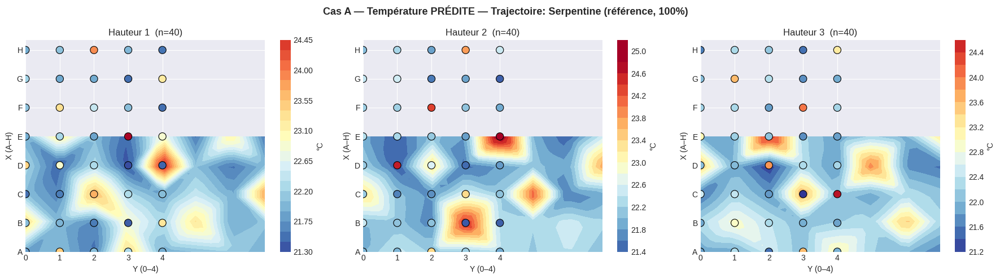

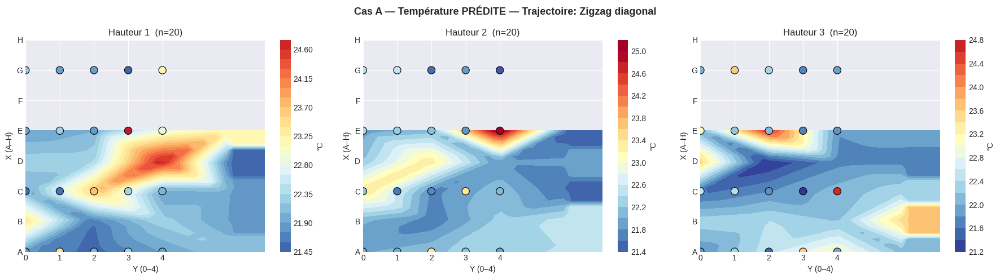

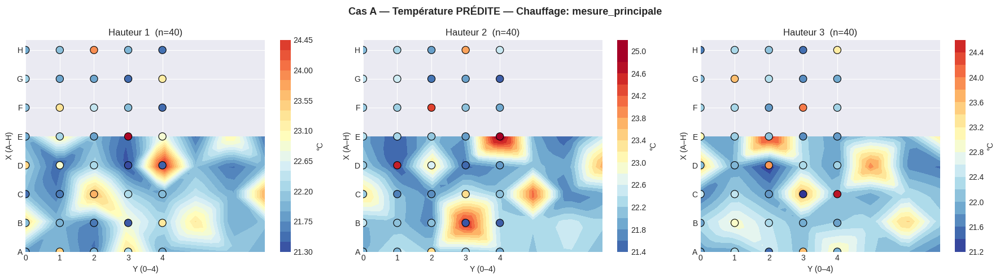

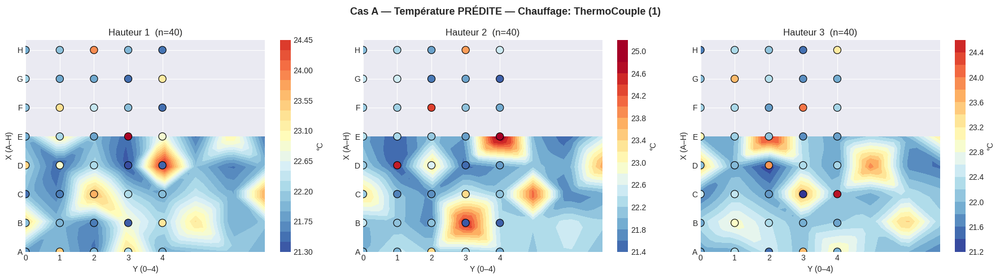

In [ ]:
# ── VISUALISATIONS CAS A — Température PRÉDITE uniquement, par trajectoire et par chauffage ──
info_A = df_fusion.loc[test_idx_A, ['trajectory_type', 'heating_type']].reset_index(drop=True)
pts_A  = df_fusion.loc[test_idx_A, ['x', 'y', 'z']].reset_index(drop=True)

# ── Par TRAJECTOIRE ──────────────────────────────────────────────────────
for traj in info_A['trajectory_type'].unique():
    mask = (info_A['trajectory_type'] == traj).values
    if mask.sum() < 4:
        continue
    plot_champ_2d_par_hauteur(
        pts_A.loc[mask, 'x'], pts_A.loc[mask, 'y'], pts_A.loc[mask, 'z'], pred_A[mask],
        titre=f'Cas A — Température PRÉDITE — Trajectoire: {traj}',
        cmap='RdYlBu_r', label_cbar='°C',
    )
    plot_champ_3d(
        pts_A.loc[mask, 'x'], pts_A.loc[mask, 'y'], pts_A.loc[mask, 'z'], pred_A[mask],
        titre=f'Cas A — Température PRÉDITE 3D — Trajectoire: {traj}',
        cmap='RdYlBu_r', label_cbar='°C',
    )

# ── Par TYPE DE CHAUFFAGE ─────────────────────────────────────────────────
for chauff in info_A['heating_type'].unique():
    mask = (info_A['heating_type'] == chauff).values
    if mask.sum() < 4:
        continue
    plot_champ_2d_par_hauteur(
        pts_A.loc[mask, 'x'], pts_A.loc[mask, 'y'], pts_A.loc[mask, 'z'], pred_A[mask],
        titre=f'Cas A — Température PRÉDITE — Chauffage: {chauff}',
        cmap='RdYlBu_r', label_cbar='°C',
    )
    plot_champ_3d(
        pts_A.loc[mask, 'x'], pts_A.loc[mask, 'y'], pts_A.loc[mask, 'z'], pred_A[mask],
        titre=f'Cas A — Température PRÉDITE 3D — Chauffage: {chauff}',
        cmap='RdYlBu_r', label_cbar='°C',
    )

### Cas B — type de trajectoire / chauffage comme CIBLE (classification)

X_B_scaled : (414756, 19), 31.5 Mo
⚠️ Rappel : la classification de trajectory_type est approximative (chevauchement des sous-ensembles — voir avertissement section 23). Split temporel par groupe (identique au Cas A) pour limiter la fuite.


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   19.1s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   38.7s finished


  (fit terminé en 39.1s)


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.5s finished



=== Classifieur trajectory_type ===
Accuracy : 0.5193
                               precision    recall  f1-score   support

                    Aléatoire       0.00      0.00      0.00      8621
FPS (échantillonnage optimal)       0.00      0.00      0.00      8621
                    Périmètre       0.00      0.00      0.00     11854
 Serpentine (référence, 100%)       0.52      1.00      0.68     43080
              Zigzag diagonal       0.00      0.00      0.00     10776

                     accuracy                           0.52     82952
                    macro avg       0.10      0.20      0.14     82952
                 weighted avg       0.27      0.52      0.36     82952



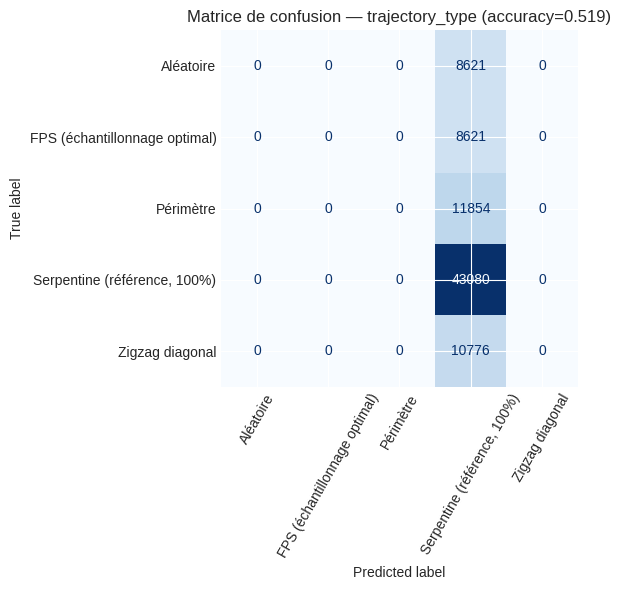

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:   17.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   34.5s finished


  (fit terminé en 34.9s)


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.2s finished



=== Classifieur heating_type ===
Accuracy : 0.7405
                   precision    recall  f1-score   support

 ThermoCouple (1)       0.00      0.00      0.00     21528
mesure_principale       0.74      1.00      0.85     61424

         accuracy                           0.74     82952
        macro avg       0.37      0.50      0.43     82952
     weighted avg       0.55      0.74      0.63     82952



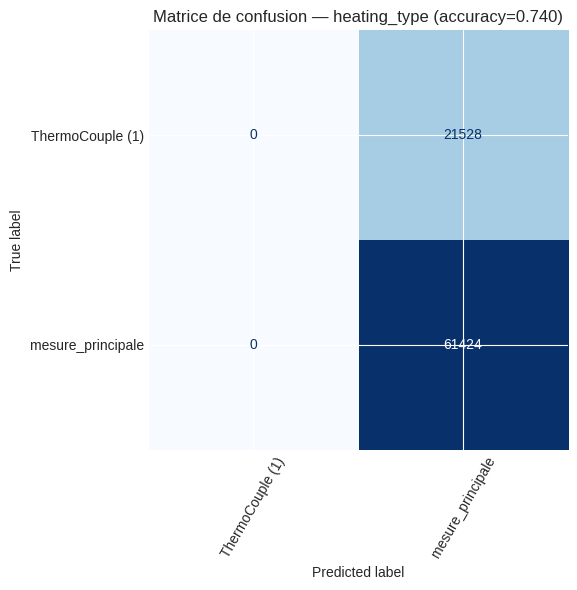

In [ ]:
# ── CAS B : type comme CIBLE (classification à partir du champ mesuré) ───
import gc, time
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

assert 'train_idx_A' in globals() and 'test_idx_A' in globals(), \
    "Exécutez d'abord le Cas A (cellule précédente) : train_idx_A/test_idx_A manquants."

# ── Libère la RAM du Cas A avant de repartir (évite le crash OOM Colab) ───
for _var in ('df_fusion_enc', 'X_A', 'X_A_scaled'):
    if _var in globals():
        del globals()[_var]
gc.collect()

feature_cols_B = feature_cols + ['temperature']  # la température fait partie de ce qu'on observe pour deviner le type

X_B = df_fusion[feature_cols_B].values
y_B_traj = df_fusion['trajectory_type'].values
y_B_heat = df_fusion['heating_type'].values

scaler_B = StandardScaler()
X_B_scaled = scaler_B.fit_transform(X_B).astype(np.float32)  # float32 au lieu de float64 : divise la RAM par 2

print(f'X_B_scaled : {X_B_scaled.shape}, {X_B_scaled.nbytes / 1e6:.1f} Mo')

# ── Split : on réutilise le split temporel PAR GROUPE du Cas A ───────────
# (même indices, car df_fusion_enc = df_fusion.reset_index(drop=True) + dummies)
# -> pas de train_test_split aléatoire ici : les lignes d'une même trajectoire
#    sont trop corrélées (positions/instants voisins), un split aléatoire fuit
#    de l'info et gonfle artificiellement l'accuracy. Ça évite aussi le crash
#    de `stratify=y` si une classe est trop rare (cf. avertissement chevauchement).

def entrainer_classifieur(X, y, nom_cible, train_idx, test_idx, seed=42):
    Xtr, Xte = X[train_idx], X[test_idx]
    ytr, yte = y[train_idx], y[test_idx]

    # sécurité : si une classe du test n'existe pas dans le train (chevauchement
    # trop marqué), on prévient plutôt que de planter silencieusement
    classes_train = set(np.unique(ytr))
    classes_test_absentes = set(np.unique(yte)) - classes_train
    if classes_test_absentes:
        print(f'  ⚠️ classes absentes du train pour {nom_cible} : {classes_test_absentes}')

    # n_estimators réduit + max_depth borné + verbose : limite le pic RAM et
    # affiche la progression (au lieu d'un silence total jusqu'au crash)
    clf = ExtraTreesClassifier(
        n_estimators=100, max_depth=20, min_samples_leaf=2,
        random_state=seed, n_jobs=1, verbose=1,
    )
    t0 = time.time()
    clf.fit(Xtr, ytr)
    print(f'  (fit terminé en {time.time() - t0:.1f}s)')
    pred = clf.predict(Xte)
    acc = accuracy_score(yte, pred)
    print(f'\n=== Classifieur {nom_cible} ===')
    print(f'Accuracy : {acc:.4f}')
    print(classification_report(yte, pred, zero_division=0))
    cm = confusion_matrix(yte, pred, labels=clf.classes_)
    fig, ax = plt.subplots(figsize=(7, 6))
    ConfusionMatrixDisplay(cm, display_labels=clf.classes_).plot(
        ax=ax, xticks_rotation=60, cmap='Blues', colorbar=False)
    ax.set_title(f'Matrice de confusion — {nom_cible} (accuracy={acc:.3f})')
    plt.tight_layout(); plt.show()
    gc.collect()
    return clf, acc


print("⚠️ Rappel : la classification de trajectory_type est approximative "
      "(chevauchement des sous-ensembles — voir avertissement section 23). "
      "Split temporel par groupe (identique au Cas A) pour limiter la fuite.")
clf_traj, acc_traj = entrainer_classifieur(X_B_scaled, y_B_traj, 'trajectory_type', train_idx_A, test_idx_A)
clf_heat, acc_heat = entrainer_classifieur(X_B_scaled, y_B_heat, 'heating_type', train_idx_A, test_idx_A)

#### Visualisations — Cas B (fiabilité spatiale de la classification)


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.5s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.1s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.8s finished


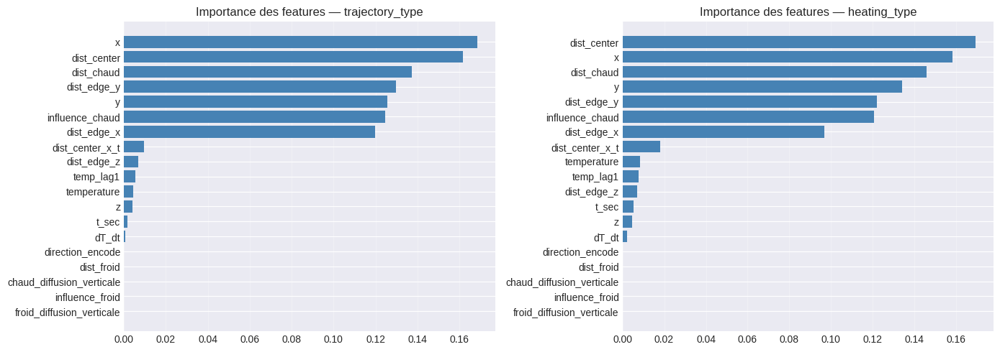

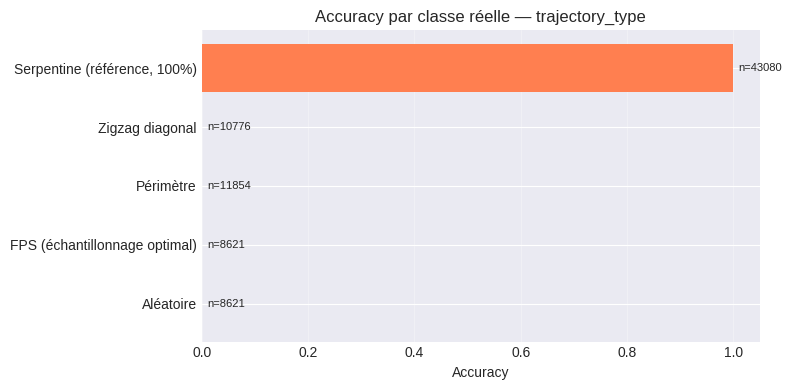

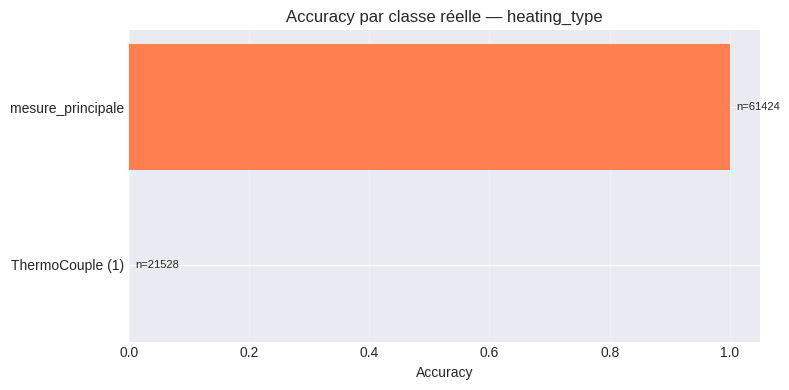

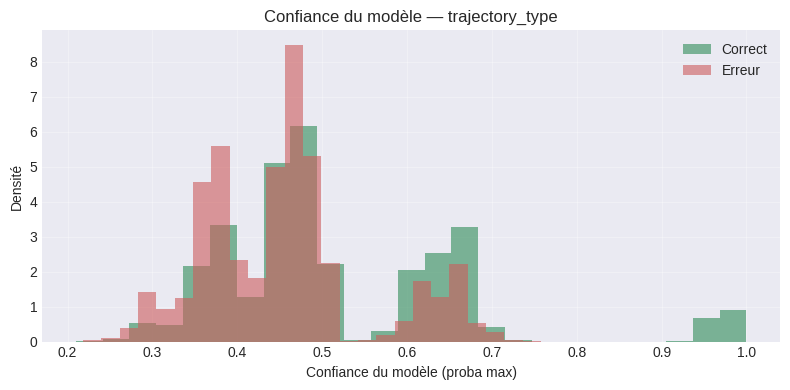

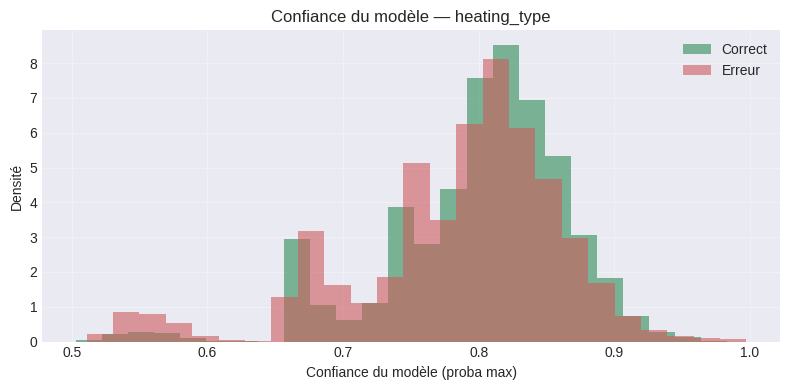

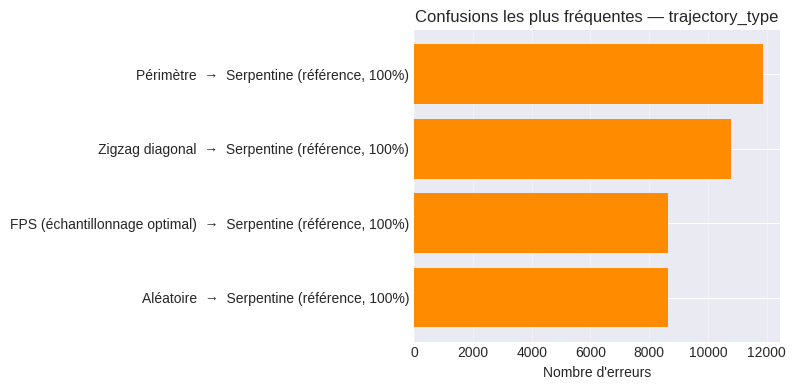

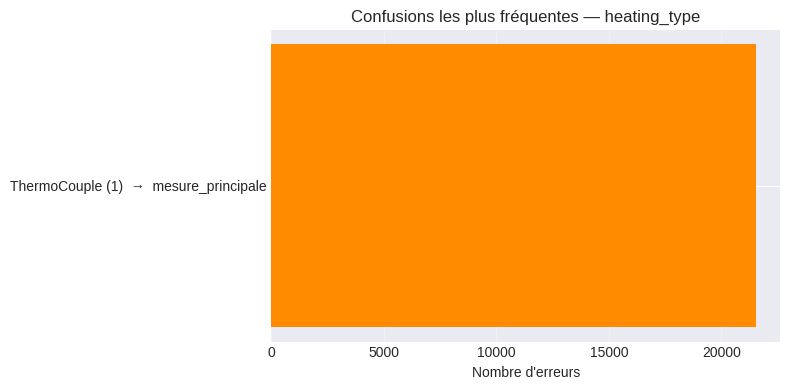

In [ ]:
# ── VISUALISATIONS CAS B — Comprendre la classification (au-delà du spatial) ──
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

pred_traj_test = clf_traj.predict(X_B_scaled[test_idx_A])
pred_heat_test = clf_heat.predict(X_B_scaled[test_idx_A])
vrai_traj_test = y_B_traj[test_idx_A]
vrai_heat_test = y_B_heat[test_idx_A]

proba_traj_test = clf_traj.predict_proba(X_B_scaled[test_idx_A])
proba_heat_test = clf_heat.predict_proba(X_B_scaled[test_idx_A])

# ── 1) Importance des features pour chaque classifieur ───────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
for ax, clf, nom in zip(axes, [clf_traj, clf_heat], ['trajectory_type', 'heating_type']):
    imp = pd.DataFrame({'Feature': feature_cols_B, 'Importance': clf.feature_importances_}) \
            .sort_values('Importance', ascending=False)
    ax.barh(imp['Feature'], imp['Importance'], color='steelblue')
    ax.invert_yaxis()
    ax.set_title(f'Importance des features — {nom}')
    ax.grid(True, alpha=0.3, axis='x')
plt.tight_layout(); plt.show()

# ── 2) Accuracy par classe (certaines classes sont-elles plus difficiles ?) ──
def accuracy_par_classe(y_vrai, y_pred, nom_cible):
    df_r = pd.DataFrame({'vrai': y_vrai, 'pred': y_pred})
    df_r['correct'] = (df_r['vrai'] == df_r['pred']).astype(int)
    tab = df_r.groupby('vrai')['correct'].agg(['mean', 'count']) \
              .rename(columns={'mean': 'accuracy', 'count': 'n'}) \
              .sort_values('accuracy')
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.barh(tab.index, tab['accuracy'], color='coral')
    for i, (acc, n) in enumerate(zip(tab['accuracy'], tab['n'])):
        ax.text(acc + 0.01, i, f'n={n}', va='center', fontsize=8)
    ax.set_xlim(0, 1.05)
    ax.set_xlabel('Accuracy'); ax.set_title(f'Accuracy par classe réelle — {nom_cible}')
    ax.grid(True, alpha=0.3, axis='x')
    plt.tight_layout(); plt.show()
    return tab

tab_traj = accuracy_par_classe(vrai_traj_test, pred_traj_test, 'trajectory_type')
tab_heat = accuracy_par_classe(vrai_heat_test, pred_heat_test, 'heating_type')

# ── 3) Confiance du modèle : correct vs erroné ────────────────────────────
def plot_confiance(proba, y_vrai, y_pred, classes, nom_cible):
    conf_max = proba.max(axis=1)
    correct = (y_vrai == y_pred)
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.hist(conf_max[correct], bins=25, alpha=0.6, label='Correct', color='seagreen', density=True)
    ax.hist(conf_max[~correct], bins=25, alpha=0.6, label='Erreur', color='indianred', density=True)
    ax.set_xlabel('Confiance du modèle (proba max)'); ax.set_ylabel('Densité')
    ax.set_title(f'Confiance du modèle — {nom_cible}')
    ax.legend(); ax.grid(True, alpha=0.3)
    plt.tight_layout(); plt.show()

plot_confiance(proba_traj_test, vrai_traj_test, pred_traj_test, clf_traj.classes_, 'trajectory_type')
plot_confiance(proba_heat_test, vrai_heat_test, pred_heat_test, clf_heat.classes_, 'heating_type')

# ── 4) Paires de confusion les plus fréquentes ────────────────────────────
def top_confusions(y_vrai, y_pred, nom_cible, top_n=8):
    mask_err = y_vrai != y_pred
    if mask_err.sum() == 0:
        print(f'{nom_cible} : aucune erreur de classification.')
        return
    df_err = pd.DataFrame({'vrai': y_vrai[mask_err], 'pred': y_pred[mask_err]})
    tab = df_err.groupby(['vrai', 'pred']).size().reset_index(name='n') \
                .sort_values('n', ascending=False).head(top_n)
    tab['paire'] = tab['vrai'] + '  →  ' + tab['pred']
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.barh(tab['paire'], tab['n'], color='darkorange')
    ax.invert_yaxis()
    ax.set_xlabel("Nombre d'erreurs"); ax.set_title(f'Confusions les plus fréquentes — {nom_cible}')
    ax.grid(True, alpha=0.3, axis='x')
    plt.tight_layout(); plt.show()

top_confusions(vrai_traj_test, pred_traj_test, 'trajectory_type')
top_confusions(vrai_heat_test, pred_heat_test, 'heating_type')

### Cas C — LES DEUX : pipeline classification → régression (scénario réaliste)

In [ ]:
# ── CAS C : type PRÉDIT (pipeline réaliste, pas d'oracle) ────────────────
# À l'inférence, on ne connaît pas le vrai type -> on le devine avec les
# classifieurs du Cas B, puis on utilise ce type PRÉDIT comme feature pour
# le modèle de régression (même architecture que le Cas A).

idx_utiles = np.concatenate([train_idx_A, test_idx_A])  # = toutes les lignes réellement utilisées

traj_pred_utiles = clf_traj.predict(X_B_scaled[idx_utiles])
heat_pred_utiles = clf_heat.predict(X_B_scaled[idx_utiles])

# on replace les prédictions dans un tableau de la taille de df_fusion,
# pour pouvoir ré-indexer ensuite par train_idx_A / test_idx_A comme avant
traj_pred_all = np.empty(len(df_fusion), dtype=object)
heat_pred_all = np.empty(len(df_fusion), dtype=object)
traj_pred_all[idx_utiles] = traj_pred_utiles
heat_pred_all[idx_utiles] = heat_pred_utiles

traj_dummies_pred = pd.get_dummies(pd.Series(traj_pred_all[idx_utiles]), prefix='traj') \
                       .reindex(columns=traj_dummies.columns, fill_value=0)
heat_dummies_pred = pd.get_dummies(pd.Series(heat_pred_all[idx_utiles]), prefix='chauff') \
                       .reindex(columns=heat_dummies.columns, fill_value=0)

X_C_utiles = np.hstack([
    df_fusion.iloc[idx_utiles][feature_cols].values,
    traj_dummies_pred.values,
    heat_dummies_pred.values,
])
X_C_scaled_utiles = scaler_A.transform(X_C_utiles)  # même scaler que le Cas A (mêmes colonnes, même ordre)

# repositionner train/test à l'intérieur du sous-ensemble idx_utiles
n_train = len(train_idx_A)
X_train_C, X_test_C = X_C_scaled_utiles[:n_train], X_C_scaled_utiles[n_train:]
y_train_C, y_test_C = y_A[train_idx_A], y_A[test_idx_A]  # même cible température, mêmes indices que le Cas A

model_C = ExtraTreesRegressor(**best_params, random_state=42, n_jobs=-1)
model_C.fit(X_train_C, y_train_C)
pred_C = model_C.predict(X_test_C)

rmse_C = np.sqrt(mean_squared_error(y_test_C, pred_C))
mae_C  = mean_absolute_error(y_test_C, pred_C)
mape_C = mean_absolute_percentage_error(y_test_C, pred_C) * 100
r2_C   = r2_score(y_test_C, pred_C)

print('CAS C — type prédit (pipeline classification -> régression, réaliste)')
print(f'  RMSE={rmse_C:.4f}°C  MAE={mae_C:.4f}°C  MAPE={mape_C:.2f}%  R²={r2_C:.4f}')

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.2s finished


CAS C — type prédit (pipeline classification -> régression, réaliste)
  RMSE=0.5089°C  MAE=0.0387°C  MAPE=0.13%  R²=0.7338


#### Visualisations — Cas C (pipeline réaliste vs oracle)


In [ ]:
# ── VISUALISATIONS CAS C (2D + 3D + courbe) — coût réel du pipeline vs oracle ─────

# Fix : erreur_A n'était pas encore défini (à calculer une seule fois, réutilisable)
if 'erreur_A' not in globals():
    erreur_A = np.abs(y_test_A - pred_A)

pts_C = df_fusion.loc[test_idx_A, ['x', 'y', 'z']].reset_index(drop=True)
erreur_C = np.abs(y_test_C - pred_C)
delta_erreur = erreur_C - erreur_A   # >0 : le pipeline (type deviné) est pire que l'oracle

# ── 2D : température prédite (Cas C) ──────────────────────────────────────
plot_champ_2d_par_hauteur(
    pts_C['x'], pts_C['y'], pts_C['z'], pred_C,
    titre=f'Cas C — Température PRÉDITE (pipeline réaliste) — RMSE={rmse_C:.3f}°C',
)

# ── 2D : surcoût d'erreur vs oracle ───────────────────────────────────────
lim = max(abs(np.percentile(delta_erreur, 2)), abs(np.percentile(delta_erreur, 98)), 1e-6)
plot_champ_2d_par_hauteur(
    pts_C['x'], pts_C['y'], pts_C['z'], delta_erreur,
    titre="Cas C vs Cas A — Surcoût d'erreur (rouge = pipeline pire que l'oracle)",
    cmap='coolwarm', vmin=-lim, vmax=lim, label_cbar='Δ erreur (°C)',
)

# ── 3D : température prédite (Cas C) ──────────────────────────────────────
plot_champ_3d(
    pts_C['x'], pts_C['y'], pts_C['z'], pred_C,
    titre=f'Cas C — Température PRÉDITE 3D (pipeline réaliste) — RMSE={rmse_C:.3f}°C',
    cmap='RdYlBu_r', label_cbar='°C',
)

# ── 3D : surcoût d'erreur vs oracle ───────────────────────────────────────
hover_C = [f'erreur C={ec:.2f}°C / erreur A={ea:.2f}°C' for ec, ea in zip(erreur_C, erreur_A)]
plot_champ_3d(
    pts_C['x'], pts_C['y'], pts_C['z'], delta_erreur,
    titre="Cas C vs Cas A — Surcoût d'erreur en 3D (pipeline réaliste vs oracle)",
    cmap='RdBu_r', label_cbar='Δ erreur (°C)', hover_extra=hover_C,
)

# ── Courbe test : température réelle vs prédite (triée par valeur réelle) ─
ordre = np.argsort(y_test_C)
plt.figure(figsize=(12, 5))
plt.plot(y_test_C[ordre], label='Réel', color='black', lw=1.5)
plt.plot(pred_C[ordre], label='Prédit (Cas C)', color='coral', alpha=0.8, lw=1.2)
plt.plot(pred_A[np.argsort(y_test_A)], label='Prédit (Cas A - oracle)', color='steelblue',
         alpha=0.6, lw=1, ls='--')
plt.xlabel('Points de test (triés par température réelle)')
plt.ylabel('Température (°C)')
plt.title('Courbe test — Réel vs Prédit (Cas A oracle vs Cas C pipeline)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Comparaison finale des 3 cas

In [ ]:
# ── TABLEAU COMPARATIF DES 3 CAS ──────────────────────────────────────────
tableau_3cas = pd.DataFrame([
    {'Cas': 'A — type = feature (oracle)', 'RMSE (°C)': rmse_A, 'MAE (°C)': mae_A,
     'MAPE (%)': mape_A, 'R2': r2_A, 'Accuracy classif.': np.nan},
    {'Cas': 'B — type = cible (classification pure)', 'RMSE (°C)': np.nan, 'MAE (°C)': np.nan,
     'MAPE (%)': np.nan, 'R2': np.nan,
     'Accuracy classif.': f'traj={acc_traj:.3f} / chauff={acc_heat:.3f}'},
    {'Cas': 'C — pipeline (type prédit -> régression)', 'RMSE (°C)': rmse_C, 'MAE (°C)': mae_C,
     'MAPE (%)': mape_C, 'R2': r2_C, 'Accuracy classif.': np.nan},
])
print('COMPARAISON DES 3 CAS')
display(tableau_3cas.round(4))

fig, ax = plt.subplots(figsize=(7, 5))
cas_reg = tableau_3cas.dropna(subset=['RMSE (°C)'])
ax.bar(cas_reg['Cas'], cas_reg['RMSE (°C)'], color=['steelblue', 'coral'])
ax.set_ylabel('RMSE (°C)')
ax.set_title('RMSE : type connu (oracle, Cas A) vs type prédit (pipeline, Cas C)')
ax.tick_params(axis='x', rotation=15)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout(); plt.show()

print(
    "\nInterprétation :\n"
    "- Cas A donne la borne basse du RMSE (le modèle connaît déjà le type).\n"
    "- Cas C montre le coût réel en précision quand le type doit être deviné.\n"
    "- Si acc_traj / acc_heat sont élevées (proches de 1), le Cas C devrait être "
    "proche du Cas A. Un écart important signale que le type n'est pas assez "
    "détectable depuis le champ mesuré seul."
)

## 24 — Visualisation récapitulative et recommandation

Synthèse visuelle des 3 cas et recommandation automatique pour le déploiement (quel pipeline utiliser en pratique).


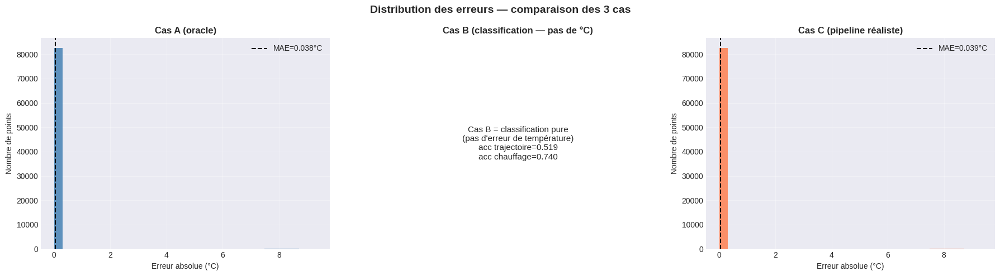

RECOMMANDATION
  MAE oracle (Cas A)      : 0.038°C
  MAE pipeline (Cas C)    : 0.039°C  (+0.8% vs oracle)
  Accuracy classification : trajectoire=0.519 / chauffage=0.740

Le pipeline réaliste (Cas C) est presque aussi précis que l'oracle (Cas A). -> Le déployer directement : la classification amont n'est pas un goulot d'étranglement.


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# ── VISUALISATION RÉCAPITULATIVE + RECOMMANDATION AUTOMATIQUE ────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
comparatif = {
    'Cas A (oracle)': erreur_A,
    'Cas B (classification — pas de °C)': None,
    'Cas C (pipeline réaliste)': erreur_C,
}
for ax, (nom, err) in zip(axes, comparatif.items()):
    if err is None:
        ax.text(0.5, 0.5,
                f"Cas B = classification pure\n(pas d'erreur de température)\n"
                f"acc trajectoire={acc_traj:.3f}\nacc chauffage={acc_heat:.3f}",
                ha='center', va='center', fontsize=11)
        ax.set_axis_off(); ax.set_title(nom, fontweight='bold')
        continue
    ax.hist(err, bins=30, color='steelblue' if nom.startswith('Cas A') else 'coral', alpha=0.85)
    ax.axvline(err.mean(), color='black', ls='--', label=f'MAE={err.mean():.3f}°C')
    ax.set_title(nom, fontweight='bold'); ax.set_xlabel('Erreur absolue (°C)')
    ax.set_ylabel('Nombre de points'); ax.legend(); ax.grid(True, alpha=0.3)
plt.suptitle('Distribution des erreurs — comparaison des 3 cas', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

# ── Carte 3D combinée : erreur du pipeline réellement déployé (Cas C) ────
plot_champ_3d(
    pts_C['x'], pts_C['y'], pts_C['z'], erreur_C,
    titre=f"Recommandation — erreur 3D attendue en production (Cas C) — MAE={mae_C:.3f}°C",
    cmap='YlOrRd', label_cbar='erreur (°C)',
)

# ── Recommandation textuelle automatique ──────────────────────────────────
ecart_relatif = (mae_C - mae_A) / mae_A * 100 if mae_A > 0 else np.nan
print('RECOMMANDATION')
print(f'  MAE oracle (Cas A)      : {mae_A:.3f}°C')
print(f'  MAE pipeline (Cas C)    : {mae_C:.3f}°C  ({ecart_relatif:+.1f}% vs oracle)')
print(f'  Accuracy classification : trajectoire={acc_traj:.3f} / chauffage={acc_heat:.3f}')

if ecart_relatif < 10:
    verdict = ("Le pipeline réaliste (Cas C) est presque aussi précis que l'oracle (Cas A). "
               "-> Le déployer directement : la classification amont n'est pas un goulot d'étranglement.")
elif ecart_relatif < 30:
    verdict = ("Le pipeline réaliste (Cas C) perd une précision modérée par rapport à l'oracle. "
               "-> Utilisable en production, mais envisager d'améliorer le classifieur (plus de features, "
               "plus de données) avant un déploiement critique.")
else:
    verdict = ("Le pipeline réaliste (Cas C) perd nettement en précision par rapport à l'oracle. "
               "-> Le type (trajectoire/chauffage) n'est pas assez identifiable depuis le champ mesuré seul : "
               "revoir les features de classification, ou capturer le type par un autre moyen (métadonnée "
               "connue au moment de la mesure) plutôt que de le deviner.")
print('\n' + verdict)
